# Demo on PBMC dataset

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os,sys
import numpy as np
import pandas as pd
import scanpy as sc
import scvi
import scipy
import anndata

import matplotlib.pyplot as plt
from matplotlib.pyplot import rc_context
import seaborn as sns

import q2r_uncertainty
import diff2atlas


Global seed set to 0


In [3]:
import celltypist
import milopy

In [4]:
## r2py setup
import rpy2.rinterface_lib.callbacks
import logging
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

import anndata2ri
anndata2ri.activate()

dirname: Trying to get version of get_version from dirname /home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages
dirname: Failed; Does not match re.compile('get[_-]version-([\\d.]+?)(?:\\.dev(\\d+))?(?:[_+-]([0-9a-zA-Z.]+))?$')
git: Trying to get version from git in directory /home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages
git: Failed; directory is not managed by git
metadata: Trying to get version for get_version in dir /home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages
metadata: Succeeded
dirname: Trying to get version of anndata2ri from dirname /home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages
dirname: Failed; Does not match re.compile('anndata2ri-([\\d.]+?)(?:\\.dev(\\d+))?(?:[_+-]([0-9a-zA-Z.]+))?$')
git: Trying to get version from git in directory /home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages
git: Failed; directory is not managed by git
metadata: Trying to get version for anndata2ri in dir /home/jovyan/my-cond

In [5]:
%load_ext rpy2.ipython

In [6]:
%%R
library(tidyverse)
library(patchwork)

In [7]:
## Some utils

def _plot_nhood_sizes(adata, bins=50, **kwargs):
    plt.hist(np.array(adata.obsm['nhoods'].sum(0)).ravel(), bins=bins, **kwargs);
    plt.xlabel('# cells');plt.ylabel('# nhoods');
    
def get_nhood_adata(adata):
    return(adata.uns['nhood_adata'])

### Load dataset

Built in [here](https://github.com/emdann/query2reference_uncertainty/blob/master/notebooks/PBMC_metanalysis/20220531_PBMC_metadata.ipynb)

In [134]:
data_dir = '/home/jovyan/mount/gdrive/query2reference/PBMC_CZIintegration_data/'
adata = sc.read_h5ad(data_dir + 'PBMC_merged.normal.subsample500cells.scVI.h5ad')

In [43]:
adata

AnnData object with n_obs × n_vars = 634000 × 5000
    obs: 'sex', 'tissue', 'ethnicity', 'disease', 'assay', 'assay_ontology_term_id', 'sample_id', 'donor_id', 'dataset_id', 'development_stage', 'cell_type', 'n_counts', 'batch', '_scvi_batch', '_scvi_labels'
    var: 'gene_id', 'gene_name', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: '_scvi', 'hvg', 'scVI', 'umap'
    obsm: 'X_scVI', 'X_umap'
    layers: 'counts'
    obsp: 'scVI_connectivities', 'scVI_distances'

In [135]:
%%time
sc.tl.leiden(adata, resolution=1.5, neighbors_key='scVI', n_iterations=5)

CPU times: user 7min 55s, sys: 11.1 s, total: 8min 6s
Wall time: 8min 5s


In [45]:
# adata.write_h5ad(data_dir + 'PBMC_merged.normal.subsample500cells.scVI.h5ad')

In [80]:
# adata = sc.read_h5ad(data_dir + 'PBMC_merged.normal.subsample500cells.scVI.h5ad', backed=True)

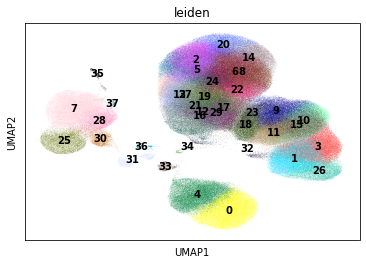

In [136]:
sc.pl.umap(adata, color='leiden', legend_loc='on data')

In [137]:
conf_mat = sc.metrics.confusion_matrix('leiden', 'cell_type', adata.obs)

In [138]:
cell_type_leiden = dict(zip(conf_mat.index, conf_mat.idxmax(1)))
cell_type_leiden_frac = dict(zip(conf_mat.index, conf_mat.max(1)))

adata.obs['cell_type_leiden'] = [cell_type_leiden[x] for x in adata.obs['leiden']]
adata.obs['cell_type_leiden_frac'] = [cell_type_leiden_frac[x] for x in adata.obs['leiden']]

... storing 'cell_type_leiden' as categorical


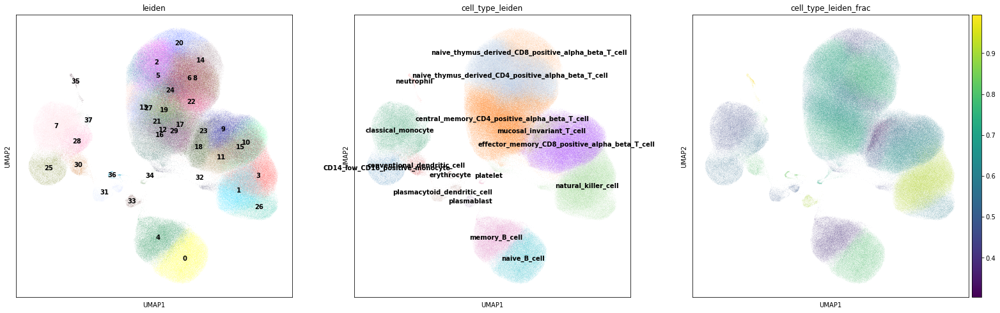

In [139]:
with rc_context({'figure.figsize':[8,8]}):
    sc.pl.umap(adata, color=['leiden', 'cell_type_leiden', 'cell_type_leiden_frac'], legend_loc='on data')

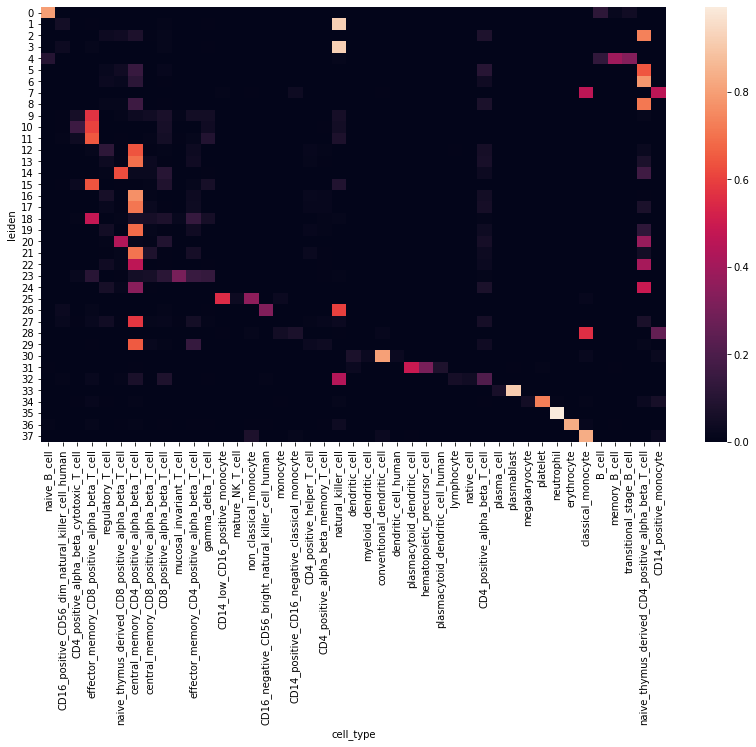

In [140]:
conf_mat_plt = conf_mat.loc[:,conf_mat.max() > 0.025]
col_order = conf_mat_plt.idxmax(0).sort_values().index
with rc_context({'figure.figsize':[14,8]}):
    sns.heatmap(conf_mat_plt.loc[:,col_order])

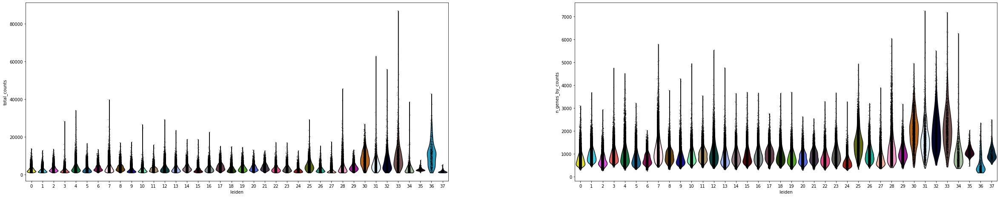

In [144]:
with rc_context({'figure.figsize':[14,8]}):
    sc.pl.violin(adata, ['total_counts', 'n_genes_by_counts'],groupby='leiden')

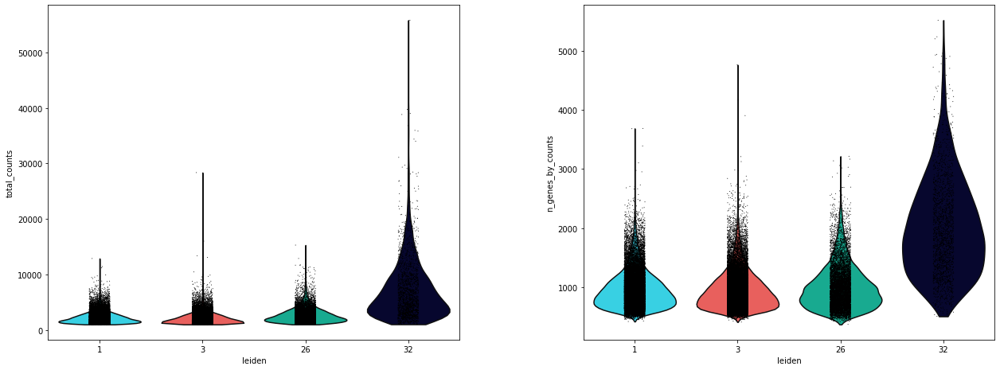

In [162]:
with rc_context({'figure.figsize':[8,8]}):
    sc.pl.violin(adata[adata.obs['cell_type_leiden'] == 'natural_killer_cell'], ['total_counts', 'n_genes_by_counts'],groupby='leiden')
#     sc.pl.scatter(adata[adata.obs['cell_type_leiden'] == 'natural_killer_cell'], 'log1p_total_counts', 'n_genes_by_counts', color='leiden', groups='26', size=10)

In [165]:
## Remove low-quality (potentially doublet) cluster
adata = adata[adata.obs['leiden'] != '32'].copy()

In [ ]:
## Make version with fixed names for submitting jobs 
def clean_pop_name(string):
    clean = ''.join(e if e.isalnum() else '_' for e in string)
    return('_'.join(clean.split('__')))

adata.obs['cell_type'] = [clean_pop_name(x) for x in adata.obs['cell_type_leiden']]

### Prep for jobs

In [179]:
adata_full = sc.read_h5ad('/home/jovyan/mount/gdrive/query2reference/PBMC_CZIintegration_data/PBMC_merged.normal.subsample500cells.h5ad')

In [180]:
adata_full

AnnData object with n_obs × n_vars = 634000 × 11724
    obs: 'sex', 'tissue', 'ethnicity', 'disease', 'assay', 'assay_ontology_term_id', 'sample_id', 'donor_id', 'dataset_id', 'development_stage', 'cell_type'
    var: 'gene_id', 'gene_name'

In [184]:
adata_full = adata_full[adata.obs_names].copy()
adata_full.obs = adata.obs.copy()
adata_full.obsm = adata.obsm.copy()

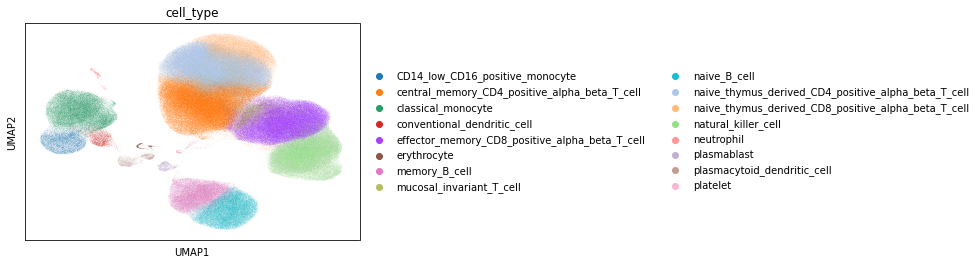

In [190]:
sc.pl.umap(adata_full, color='cell_type')

In [191]:
outdir = '/lustre/scratch117/cellgen/team205/ed6/PBMC_CZI_integration_filtered/'
adata_full.write_h5ad(outdir + 'PBMC_merged.normal.subsample500cells.clean_celltypes.h5ad')

In [192]:
outdir + 'PBMC_merged.normal.subsample500cells.clean_celltypes.h5ad'

'/lustre/scratch117/cellgen/team205/ed6/PBMC_CZI_integration_filtered/PBMC_merged.normal.subsample500cells.clean_celltypes.h5ad'

In [171]:
## Save list of celltypes
with open(outdir + 'PBMC_merged.normal.subsample500cells.clean_celltypes.txt', 'w') as f:
    for line in adata.obs['cell_type'].unique().tolist():
        f.write("%s\n" % line)

### Make plots for experiment design

In [8]:
outdir = '/lustre/scratch117/cellgen/team205/ed6/PBMC_CZI_integration_filtered/'
adata_full = sc.read_h5ad(outdir + 'PBMC_merged.normal.subsample500cells.clean_celltypes.h5ad', backed=True)
adata_full

AnnData object with n_obs × n_vars = 597321 × 11724 backed at '/lustre/scratch117/cellgen/team205/ed6/PBMC_CZI_integration_filtered/PBMC_merged.normal.subsample500cells.clean_celltypes.h5ad'
    obs: 'sex', 'tissue', 'ethnicity', 'disease', 'assay', 'assay_ontology_term_id', 'sample_id', 'donor_id', 'dataset_id', 'development_stage', 'cell_type', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'n_counts', '_scvi_batch', '_scvi_labels', 'leiden', 'cell_type_leiden', 'cell_type_leiden_frac'
    var: 'gene_id', 'gene_name'
    uns: 'cell_type_colors'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categoricals'

In [13]:
import diff2atlas
query_dataset = ['10_1038_s41591_021_01329_2']
batch_obs = 'dataset_id'
population_obs = 'cell_type'
perturb_pop = ['naive_B_cell']
split_seed = 42

#  Select query batch
query = np.array([s in query_dataset for s in adata_full.obs[batch_obs]])
adata_full.obs["is_train"] = (~query).astype(int)
adata_full.obs["is_test"] = query.astype('int')

## Split in case and ctrl
np.random.seed(split_seed)
query_samples = adata_full.obs['sample_id'][adata_full.obs[batch_obs].isin(
    query_dataset)].unique()
samples_design = np.random.choice((0, 1), len(query_samples))
adata_full.obs['is_ctrl'] = adata_full.obs['sample_id'].isin(
    query_samples[samples_design == 1]).astype(int)
adata_full.obs.loc[adata_full.obs['is_ctrl'] == 1, 'is_test'] = 0

# Remove query-specific pop from ctrl and atlas
adata_full.obs.loc[(adata_full.obs[population_obs].isin(perturb_pop)),
              'is_train'] = 0
adata_full.obs.loc[(adata_full.obs[population_obs].isin(
    perturb_pop)), 'is_ctrl'] = 0

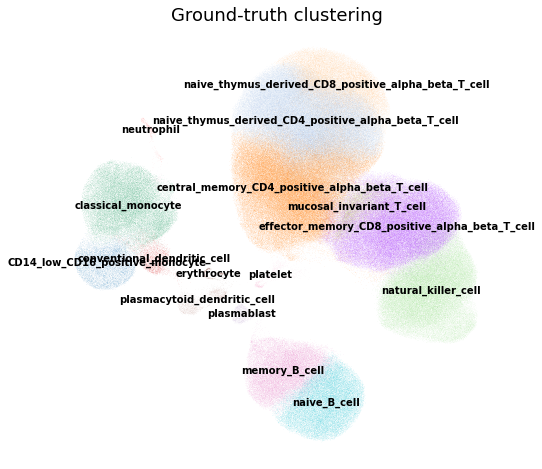

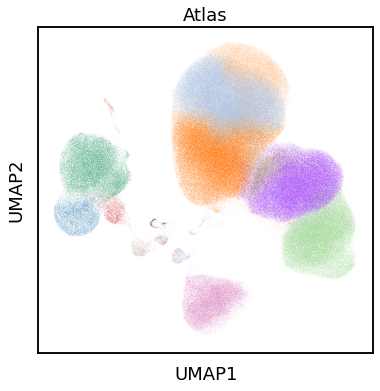

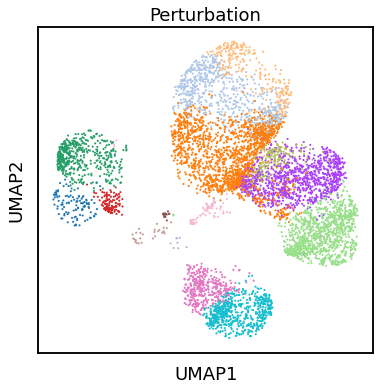

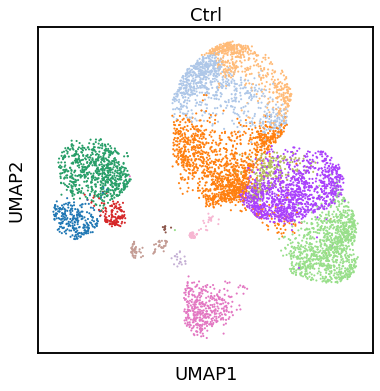

In [27]:
sns.set_context('talk');
with rc_context({'figure.figsize':[8,8]}):
    sc.pl.umap(adata_full, color='cell_type', legend_loc = 'on data', title='Ground-truth clustering', legend_fontsize=10, frameon=False);
with rc_context({'figure.figsize':[6,6]}):
    sc.pl.umap(adata_full[adata_full.obs.is_train == 1], color='cell_type', legend_loc= 'none', title='Atlas');
    sc.pl.umap(adata_full[adata_full.obs.is_test == 1], color='cell_type', legend_loc= 'none', title='Perturbation');
    sc.pl.umap(adata_full[adata_full.obs.is_ctrl == 1], color='cell_type', legend_loc= 'none', title='Ctrl');

In [24]:
## Plot number of donors and cells
donors_dict = {}
for subset in ['is_test','is_train', 'is_ctrl']:
    sdata = adata_full[adata_full.obs[subset] == 1]
    n_donors = sdata.obs['donor_id'].unique().shape[0]
    donors_dict[subset] = n_donors

In [25]:
donors_dict

{'is_test': 13, 'is_train': 1219, 'is_ctrl': 16}

In [29]:
adata_full.obs['dataset_id'].unique().shape

(13,)

---

In [8]:
sample_obs = pd.read_csv(data_dir + 'PBMC_sample_metadata.normal.csv')

In [9]:
%%R -i sample_obs
dim(sample_obs)

[1] 1268   11


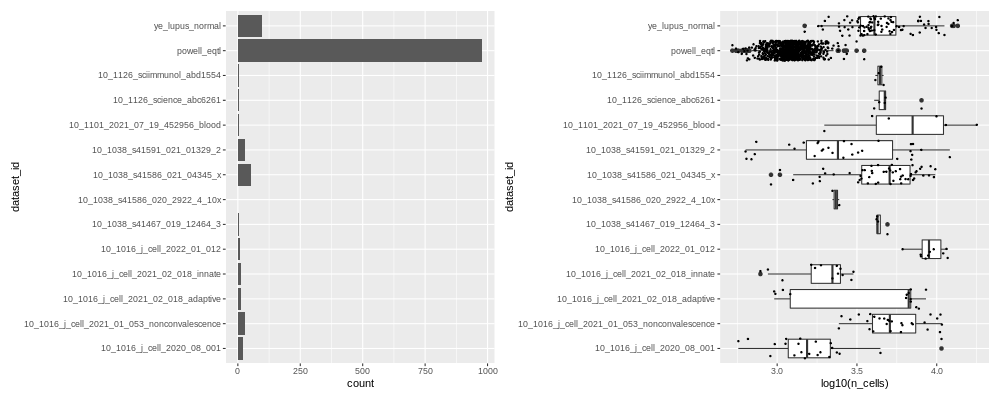

In [10]:
%%R -w 1000 -h 400
sample_obs %>%
    ggplot(aes(dataset_id)) +
    geom_bar( ) +
    coord_flip() +
sample_obs %>%
ggplot(aes(dataset_id, log10(n_cells))) +
geom_boxplot() +
geom_jitter(size=0.5) +
scale_fill_viridis_c() +
coord_flip()

### Design

- select one dataset to be query
- split in perturb and control (don't use two different datasets for now, otherwise you need to match)
- remove query-specific cluster from control and reference  

In [64]:
batch_obs = 'dataset_id'
query_dataset = '10_1038_s41591_021_01329_2' ## Stephenson et al

## Select query batch
query = np.array([s in query_dataset for s in adata.obs[batch_obs]])
adata.obs["is_train"] = (~query).astype(int)
adata.obs["is_test"] = query.astype('int')

## Split in case and ctrl
np.random.seed(40)
query_samples = sample_obs[sample_obs.dataset_id == query_dataset].sample_id
samples_design = np.random.choice((0,1), len(query_samples))
adata.obs['is_ctrl'] = adata.obs['sample_id'].isin(query_samples[samples_design==1]).astype(int)
adata.obs.loc[adata.obs['is_ctrl'] == 1, 'is_test'] = 0

In [65]:
sample_obs.index = sample_obs.sample_id.copy()
sample_obs.loc[query_samples[samples_design==1]]

,sample_id,sex,tissue,ethnicity,disease,assay,assay_ontology_term_id,donor_id,dataset_id,development_stage,n_cells
sample_id,,,,,,,,,,,
BGCV01_CV0904,BGCV01_CV0904,female,blood,unknown,normal,10x 3' transcription profiling,EFO:0030003,CV0904,10_1038_s41591_021_01329_2,fourth decade human stage,6853
BGCV02_CV0902,BGCV02_CV0902,male,blood,unknown,normal,10x 3' transcription profiling,EFO:0030003,CV0902,10_1038_s41591_021_01329_2,sixth decade human stage,2599
BGCV04_CV0911,BGCV04_CV0911,female,blood,unknown,normal,10x 3' transcription profiling,EFO:0030003,CV0911,10_1038_s41591_021_01329_2,fifth decade human stage,1905
BGCV10_CV0939,BGCV10_CV0939,male,blood,unknown,normal,10x 3' transcription profiling,EFO:0030003,CV0939,10_1038_s41591_021_01329_2,eighth decade human stage,1719
BGCV13_CV0934,BGCV13_CV0934,female,blood,unknown,normal,10x 3' transcription profiling,EFO:0030003,CV0934,10_1038_s41591_021_01329_2,third decade human stage,3408
BGCV15_CV0944,BGCV15_CV0944,male,blood,unknown,normal,10x 3' transcription profiling,EFO:0030003,CV0944,10_1038_s41591_021_01329_2,sixth decade human stage,634
MH8919176,MH8919176,female,blood,unknown,normal,10x 3' transcription profiling,EFO:0030003,MH8919176,10_1038_s41591_021_01329_2,third decade human stage,3217
MH8919178,MH8919178,male,blood,unknown,normal,10x 3' transcription profiling,EFO:0030003,MH8919178,10_1038_s41591_021_01329_2,sixth decade human stage,7016
MH8919179,MH8919179,male,blood,unknown,normal,10x 3' transcription profiling,EFO:0030003,MH8919179,10_1038_s41591_021_01329_2,fourth decade human stage,4316


In [66]:
sample_obs.loc[query_samples[samples_design==0]]

,sample_id,sex,tissue,ethnicity,disease,assay,assay_ontology_term_id,donor_id,dataset_id,development_stage,n_cells
sample_id,,,,,,,,,,,
BGCV01_CV0902,BGCV01_CV0902,male,blood,unknown,normal,10x 3' transcription profiling,EFO:0030003,CV0902,10_1038_s41591_021_01329_2,sixth decade human stage,1285
BGCV05_CV0929,BGCV05_CV0929,male,blood,unknown,normal,10x 3' transcription profiling,EFO:0030003,CV0929,10_1038_s41591_021_01329_2,seventh decade human stage,1466
BGCV08_CV0915,BGCV08_CV0915,female,blood,unknown,normal,10x 3' transcription profiling,EFO:0030003,CV0915,10_1038_s41591_021_01329_2,fifth decade human stage,1940
BGCV09_CV0917,BGCV09_CV0917,female,blood,unknown,normal,10x 3' transcription profiling,EFO:0030003,CV0917,10_1038_s41591_021_01329_2,seventh decade human stage,2924
BGCV12_CV0926,BGCV12_CV0926,female,blood,unknown,normal,10x 3' transcription profiling,EFO:0030003,CV0926,10_1038_s41591_021_01329_2,seventh decade human stage,2622
BGCV14_CV0940,BGCV14_CV0940,male,blood,unknown,normal,10x 3' transcription profiling,EFO:0030003,CV0940,10_1038_s41591_021_01329_2,seventh decade human stage,2958
MH8919177,MH8919177,female,blood,unknown,normal,10x 3' transcription profiling,EFO:0030003,MH8919177,10_1038_s41591_021_01329_2,sixth decade human stage,2223
MH8919231,MH8919231,male,blood,unknown,normal,10x 3' transcription profiling,EFO:0030003,MH8919231,10_1038_s41591_021_01329_2,fourth decade human stage,690
MH8919281,MH8919281,male,blood,unknown,normal,10x 3' transcription profiling,EFO:0030003,MH8919281,10_1038_s41591_021_01329_2,third decade human stage,724


In [77]:
# Remove query-specific population from train and ctrl cells
population_obs = 'cell_type'
ct_size = adata.obs[['sample_id', 'is_ctrl', 'is_test', 'is_train', 'cell_type']].groupby(['sample_id', 'is_ctrl', 'is_test', 'is_train', 'cell_type']).size().reset_index()

In [80]:
ct_size = ct_size[ct_size[0] > 0]

In [88]:
ct_size['group'] = ct_size[['is_ctrl', 'is_test', 'is_train']].idxmax(1)

In [89]:
%%R -i ct_size
dim(ct_size)

[1] 23549     7


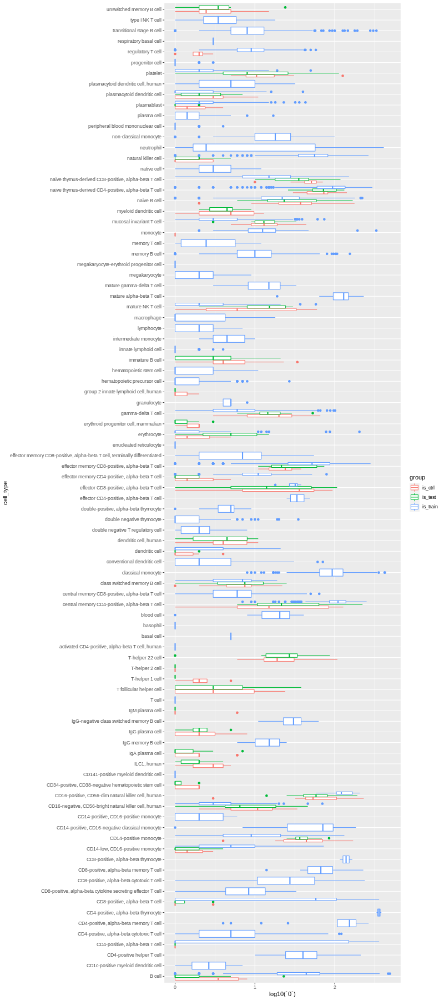

In [92]:
%%R -h 1800 -w 800
ct_size %>%
ggplot(aes(cell_type, log10(`0`))) +
geom_boxplot(aes(color=group)) +
coord_flip()

In [94]:
perturb_pop = ["naive B cell"]
adata.obs.loc[(adata.obs[population_obs].isin(perturb_pop)),
              'is_train'] = 0
adata.obs.loc[(adata.obs[population_obs].isin(
        perturb_pop)), 'is_ctrl'] = 0

In [112]:
# test that no cell is assigned to multiple splits
assert adata.obs[['is_train', 'is_test', 'is_ctrl']].sum(1).max() == 1

# test that perturbed population is in condition dataset only
assert adata[adata.obs['is_test'] == 1].obs[population_obs].isin(perturb_pop).sum() > 0
assert adata[adata.obs['is_train'] == 1].obs[population_obs].isin(perturb_pop).sum() == 0
assert adata[adata.obs['is_ctrl'] == 1].obs[population_obs].isin(perturb_pop).sum() == 0

In [120]:
adata_atlas = adata[adata.obs['is_train']==1].copy()
adata_ctrl = adata[adata.obs['is_ctrl']==1].copy()
adata_query = adata[adata.obs['is_test']==1].copy()

In [127]:
gdrive_dir = '/home/jovyan/mount/gdrive/query2reference/PBMC_CZIintegration_data/'
adata_atlas.write_h5ad(gdrive_dir + 'PBMC_merged.normal.subsample500cells.atlas.h5ad')
adata_query.write_h5ad(gdrive_dir + 'PBMC_merged.normal.subsample500cells.query.h5ad')
adata_ctrl.write_h5ad(gdrive_dir + 'PBMC_merged.normal.subsample500cells.ctrl.h5ad')

With scVI/scArches
---

In [3]:
gdrive_dir = '/home/jupyter/mount/gdrive/query2reference/PBMC_CZIintegration_data/'
adata_atlas = sc.read_h5ad(gdrive_dir + 'PBMC_merged.normal.subsample500cells.atlas.h5ad')
adata_query = sc.read_h5ad(gdrive_dir + 'PBMC_merged.normal.subsample500cells.query.h5ad')
adata_ctrl = sc.read_h5ad(gdrive_dir + 'PBMC_merged.normal.subsample500cells.ctrl.h5ad')

In [10]:
## Save raw counts in layer
adata_atlas.X = adata_atlas.layers['counts'].copy()
adata_ctrl.layers['counts'] = adata_ctrl.X.copy()
adata_query.layers['counts'] = adata_query.X.copy()


### Atlas model

In [13]:
del adata_atlas.uns['log1p']

## Feature selection on reference only
n_hvgs = 5000
overwrite_models = False

if 'log1p' not in adata_atlas.uns.keys():
    sc.pp.normalize_per_cell(adata_atlas)
    sc.pp.log1p(adata_atlas)

sc.pp.highly_variable_genes(
    adata_atlas,
    n_top_genes=n_hvgs,
    subset=True
)

In [9]:
# hvgs = adata_atlas.var_names.values

In [15]:
## Some utils
def clean_pop_name(string):
   return(''.join(e if e.isalnum() else '_' for e in string))

population_obs = 'cell_type'
perturb_pop = ["naive B cell"]
sim_id = f"qPBMC_500cells_demo_perturb_{population_obs}{clean_pop_name('-'.join(perturb_pop))}"
sim_id
if not os.path.exists(gdrive_dir + sim_id + "_models"):
    os.mkdir(gdrive_dir + sim_id + "_models")

In [18]:
diff2atlas.model_wrappers.train_scVI(adata_atlas, gdrive_dir + sim_id + "_models/model_reference", batch_key='sample_id')

INFO     Using batches from adata.obs["sample_id"]                                           


Using batches from adata.obs["sample_id"]


INFO     No label_key inputted, assuming all cells have same label                           


No label_key inputted, assuming all cells have same label


INFO     Using data from adata.layers["counts"]                                              


Using data from adata.layers["counts"]


INFO     Successfully registered anndata object containing 589174 cells, 5000 vars, 1225     
         batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates   
         and 0 extra continuous covariates.                                                  


Successfully registered anndata object containing 589174 cells, 5000 vars, 1225 batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0 extra continuous covariates.


INFO     Please do not further modify adata until model is trained.                          


Please do not further modify adata until model is trained.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 14/14: 100%|██████████| 14/14 [09:57<00:00, 42.70s/it, loss=1.09e+03, v_num=1]


SCVI Model with the following params: 
n_hidden: 128, n_latent: 10, n_layers: 2, dropout_rate: 0.2, dispersion: gene, 
gene_likelihood: zinb, latent_distribution: normal
Training status: Trained

To print summary of associated AnnData, use: scvi.data.view_anndata_setup(model.adata)

In [19]:
vae_ref = scvi.model.SCVI.load(gdrive_dir + sim_id + "_models/model_reference")

INFO     Using data from adata.layers["counts"]                                              


Using data from adata.layers["counts"]


INFO     Registered keys:['X', 'batch_indices', 'labels']                                    


Registered keys:['X', 'batch_indices', 'labels']


INFO     Successfully registered anndata object containing 589174 cells, 5000 vars, 1225     
         batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates   
         and 0 extra continuous covariates.                                                  


Successfully registered anndata object containing 589174 cells, 5000 vars, 1225 batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0 extra continuous covariates.


In [20]:
## Map query datasets
adata_query_fit = adata_query.copy()
vae_query_fit = diff2atlas.model_wrappers.fit_scVI(
    vae_ref, 
    adata_query_fit, 
    outfile=gdrive_dir + sim_id + "_models/model_fit_query2atlas/")

adata_ctrl_fit = adata_ctrl.copy()
vae_query_fit = diff2atlas.model_wrappers.fit_scVI(
    vae_ref, 
    adata_ctrl_fit, 
    outfile=gdrive_dir + sim_id + "_models/model_fit_ctrl2atlas/")

INFO     .obs[_scvi_labels] not found in target, assuming every cell is same category        


.obs[_scvi_labels] not found in target, assuming every cell is same category


INFO     Using data from adata.layers["counts"]                                              


Using data from adata.layers["counts"]


INFO     Registered keys:['X', 'batch_indices', 'labels']                                    


Registered keys:['X', 'batch_indices', 'labels']


INFO     Successfully registered anndata object containing 7000 cells, 5000 vars, 1239       
         batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates   
         and 0 extra continuous covariates.                                                  


Successfully registered anndata object containing 7000 cells, 5000 vars, 1239 batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0 extra continuous covariates.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 200/200: 100%|██████████| 200/200 [01:32<00:00,  2.15it/s, loss=1.53e+03, v_num=1]
INFO     .obs[_scvi_labels] not found in target, assuming every cell is same category        


.obs[_scvi_labels] not found in target, assuming every cell is same category


INFO     Using data from adata.layers["counts"]                                              


Using data from adata.layers["counts"]


INFO     Registered keys:['X', 'batch_indices', 'labels']                                    


Registered keys:['X', 'batch_indices', 'labels']


INFO     Successfully registered anndata object containing 7214 cells, 5000 vars, 1241       
         batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates   
         and 0 extra continuous covariates.                                                  


Successfully registered anndata object containing 7214 cells, 5000 vars, 1241 batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0 extra continuous covariates.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 200/200: 100%|██████████| 200/200 [01:33<00:00,  2.15it/s, loss=1.6e+03, v_num=1] 


### Control model

In [21]:
## Feature selection on reference only
n_hvgs = 5000
overwrite_models = False

if 'log1p' not in adata_ctrl.uns.keys():
    sc.pp.normalize_per_cell(adata_ctrl)
    sc.pp.log1p(adata_ctrl)

sc.pp.highly_variable_genes(
    adata_ctrl,
    n_top_genes=n_hvgs,
    subset=True
)

In [22]:
## Train reference model
vae_ctrl = diff2atlas.model_wrappers.train_scVI(
    adata_ctrl, 
    gdrive_dir + sim_id + "_models/model_ctrl", batch_key='sample_id')

INFO     Using batches from adata.obs["sample_id"]                                           


Using batches from adata.obs["sample_id"]


INFO     No label_key inputted, assuming all cells have same label                           


No label_key inputted, assuming all cells have same label


INFO     Using data from adata.layers["counts"]                                              


Using data from adata.layers["counts"]


INFO     Successfully registered anndata object containing 7214 cells, 5006 vars, 16 batches,
         1 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0 extra
         continuous covariates.                                                              


Successfully registered anndata object containing 7214 cells, 5006 vars, 16 batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0 extra continuous covariates.


INFO     Please do not further modify adata until model is trained.                          


Please do not further modify adata until model is trained.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 400/400: 100%|██████████| 400/400 [03:30<00:00,  1.90it/s, loss=1.46e+03, v_num=1]


In [23]:
adata_query_fit = adata_query.copy()
vae_query_fit = diff2atlas.model_wrappers.fit_scVI(
    vae_ctrl, 
    adata_query_fit, 
    outfile=gdrive_dir + sim_id + "_models/model_fit_query2ctrl/")

INFO     .obs[_scvi_labels] not found in target, assuming every cell is same category        


.obs[_scvi_labels] not found in target, assuming every cell is same category


INFO     Using data from adata.layers["counts"]                                              


Using data from adata.layers["counts"]


INFO     Registered keys:['X', 'batch_indices', 'labels']                                    


Registered keys:['X', 'batch_indices', 'labels']


INFO     Successfully registered anndata object containing 7000 cells, 5006 vars, 30 batches,
         1 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0 extra
         continuous covariates.                                                              


Successfully registered anndata object containing 7000 cells, 5006 vars, 30 batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0 extra continuous covariates.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 200/200: 100%|██████████| 200/200 [01:31<00:00,  2.18it/s, loss=1.46e+03, v_num=1]


### Merge objects for different designs

In [31]:
adata_atlas = sc.read_h5ad(gdrive_dir + 'PBMC_merged.normal.subsample500cells.atlas.h5ad')
adata_query = sc.read_h5ad(gdrive_dir + 'PBMC_merged.normal.subsample500cells.query.h5ad')
adata_ctrl = sc.read_h5ad(gdrive_dir + 'PBMC_merged.normal.subsample500cells.ctrl.h5ad')

In [32]:
pac_design_adata = anndata.concat([adata_atlas, adata_ctrl, adata_query], 
                                  label='dataset_group', 
                                  keys=['atlas', 'ctrl', 'query'])

pac_design_adata.layers['counts'] = pac_design_adata.X.copy()

vae_atlas = scvi.model.SCVI.load(gdrive_dir + sim_id + "_models/model_reference/")
vae_fit_query2atlas = scvi.model.SCVI.load(gdrive_dir + sim_id + "_models/model_fit_query2atlas/")
vae_fit_ctrl2atlas = scvi.model.SCVI.load(gdrive_dir + sim_id + "_models/model_fit_ctrl2atlas/")

pac_design_adata.obsm['X_scVI'] = np.vstack([
    vae_atlas.get_latent_representation(),
    vae_fit_ctrl2atlas.get_latent_representation(),
    vae_fit_query2atlas.get_latent_representation()
    ])

In [46]:
## perturbation-control
pc_design_adata = anndata.concat([adata_ctrl, adata_query], 
                                  label='dataset_group', 
                                  keys=['ctrl', 'query'])

pc_design_adata.layers['counts'] = pc_design_adata.X.copy()

vae_ctrl = scvi.model.SCVI.load(gdrive_dir + sim_id + "_models/model_ctrl/")
vae_fit_query2ctrl = scvi.model.SCVI.load(gdrive_dir + sim_id + "_models/model_fit_query2ctrl/")

pc_design_adata.obsm['X_scVI'] = np.vstack([
    vae_ctrl.get_latent_representation(),
    vae_fit_query2ctrl.get_latent_representation()
    ])

INFO     Using data from adata.layers["counts"]                                              


Using data from adata.layers["counts"]


INFO     Registered keys:['X', 'batch_indices', 'labels']                                    


Registered keys:['X', 'batch_indices', 'labels']


INFO     Successfully registered anndata object containing 7214 cells, 5006 vars, 16 batches,
         1 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0 extra
         continuous covariates.                                                              


Successfully registered anndata object containing 7214 cells, 5006 vars, 16 batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0 extra continuous covariates.


INFO     Using data from adata.layers["counts"]                                              


Using data from adata.layers["counts"]


INFO     Registered keys:['X', 'batch_indices', 'labels']                                    


Registered keys:['X', 'batch_indices', 'labels']


INFO     Successfully registered anndata object containing 7000 cells, 5006 vars, 30 batches,
         1 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0 extra
         continuous covariates.                                                              


Successfully registered anndata object containing 7000 cells, 5006 vars, 30 batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0 extra continuous covariates.


In [47]:
## perturbation-atlas
pa_design_adata = pac_design_adata[pac_design_adata.obs['dataset_group'] != 'ctrl'].copy()

### Save KNN classifier from reference 

In [48]:
diff2atlas.model_wrappers.train_weighted_knn(
    pac_design_adata[pac_design_adata.obs['dataset_group'] == 'atlas'],
    outfile=gdrive_dir + 'PBMC_merged.normal.subsample500cells.atlas_model.weighted_KNN_classifier.pkl',
    n_neighbors=100
    )

Weighted KNN with n_neighbors = 100 ... 

In [50]:
diff2atlas.model_wrappers.train_weighted_knn(
    pc_design_adata[pc_design_adata.obs['dataset_group'] == 'ctrl'],
    outfile=gdrive_dir + 'PBMC_merged.normal.subsample500cells.ctrl_model.weighted_KNN_classifier.pkl',
    n_neighbors=100
    )

Weighted KNN with n_neighbors = 100 ... 

### Co-embeddings

In [82]:
for adata in [pa_design_adata, pc_design_adata, pac_design_adata]:
    sc.pp.neighbors(adata, n_neighbors=30, use_rep="X_scVI")
    sc.tl.umap(adata)

In [83]:
# pa_design_adata_emb = sc.read_h5ad(gdrive_dir + 'PBMC_merged.normal.subsample500cells.PA_design.coembedding.h5ad', backed=True)
# pac_design_adata_emb = sc.read_h5ad(gdrive_dir + 'PBMC_merged.normal.subsample500cells.PAC_design.coembedding.h5ad', backed=True)
# pc_design_adata_emb = sc.read_h5ad(gdrive_dir + 'PBMC_merged.normal.subsample500cells.PC_design.coembedding.h5ad', backed=True)

# pa_design_adata.obsm['X_umap'] = pa_design_adata_emb.obsm['X_umap']

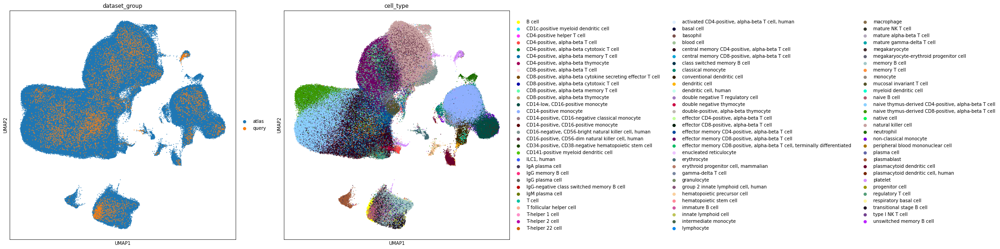

... storing 'sample_id' as categorical
... storing 'donor_id' as categorical
... storing 'development_stage' as categorical
... storing 'cell_type' as categorical


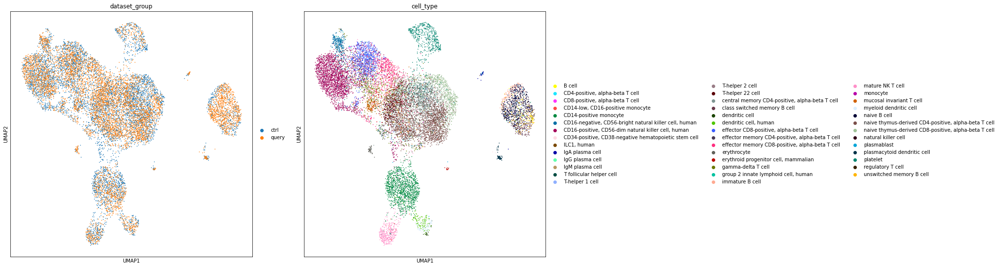

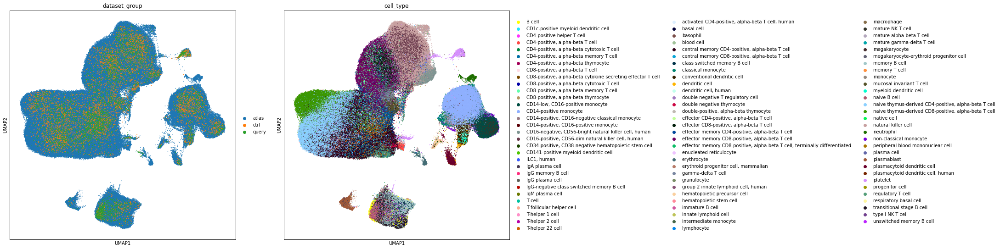

In [86]:
plt.rcParams['figure.figsize'] = [9,9]
sc.pl.umap(pa_design_adata, color=[ 'dataset_group', 'cell_type'], size=10)
sc.pl.umap(pc_design_adata, color=[ 'dataset_group', 'cell_type'], size=10)
sc.pl.umap(pac_design_adata, color=['dataset_group', 'cell_type'], size=10)

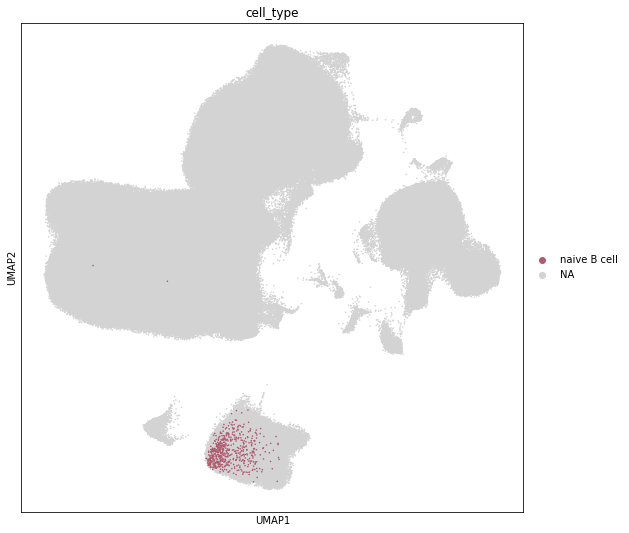

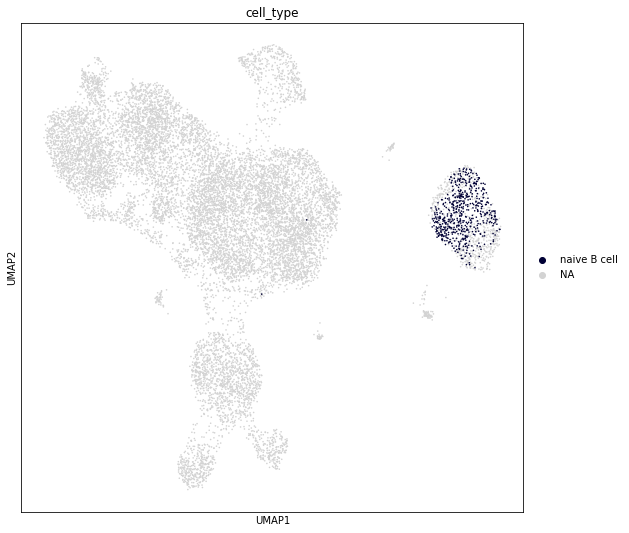

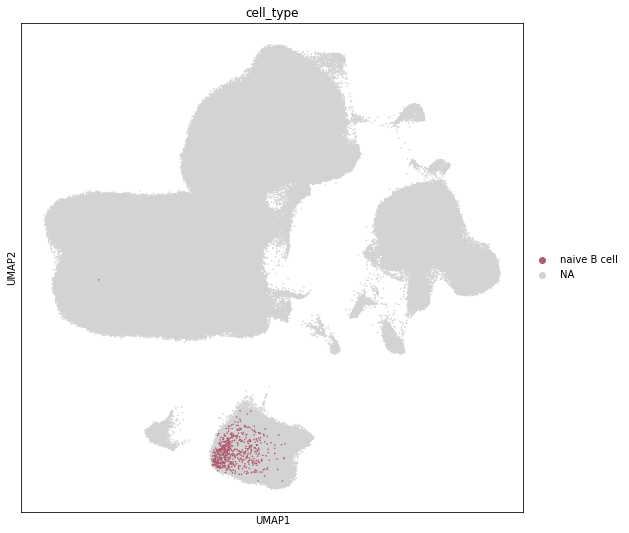

In [87]:
sc.pl.umap(pa_design_adata, color=population_obs, size=10, groups=perturb_pop)
sc.pl.umap(pc_design_adata, color=population_obs, size=10, groups=perturb_pop)
sc.pl.umap(pac_design_adata, color=population_obs, size=10, groups=perturb_pop)

### Quantify uncertainty

In [62]:
## PAC design
pac_design_adata.obs['uncertainty_labels'] = np.nan
pac_design_adata.obs['uncertainty_gex'] = np.nan
pac_design_adata.obs['uncertainty_z'] = np.nan
for d in ['ctrl', 'query']:
    is_d = pac_design_adata.obs['dataset_group'] == d
    unc_labels = diff2atlas.uncertainty_metrics.weighted_knn_transfer_uncertainty(
        model=gdrive_dir + 'PBMC_merged.normal.subsample500cells.atlas_model.weighted_KNN_classifier.pkl', 
        query_adata=pac_design_adata[is_d], 
        train_labels = pac_design_adata[pac_design_adata.obs['dataset_group'] == 'atlas'].obs['cell_type']
        )
    pac_design_adata.obs.loc[is_d, 'uncertainty_labels'] = unc_labels.values
    
    unc_gex = diff2atlas.uncertainty_metrics.trueVSpred_gex_cosine(
        model = gdrive_dir + sim_id + f"_models/model_fit_{d}2atlas/", 
        query_adata=pac_design_adata[is_d], 
        n_samples=50
        )
    pac_design_adata.obs.loc[is_d, 'uncertainty_gex'] = unc_gex
    
    unc_z = diff2atlas.uncertainty_metrics.inference_posterior_distance(
        model = gdrive_dir + sim_id + f"_models/model_fit_{d}2atlas/", 
        query_adata=pac_design_adata[is_d], 
        n_samples=50
        )
    pac_design_adata.obs.loc[is_d, 'uncertainty_z'] = unc_z

In [77]:
## PA design
pa_design_adata.obs = pd.concat([pa_design_adata.obs, pac_design_adata.obs.loc[pac_design_adata.obs['dataset_group'] != 'ctrl',['uncertainty_labels', 'uncertainty_gex', 'uncertainty_z']]], 1)

In [70]:
## PC design
pc_design_adata.obs['uncertainty_labels'] = np.nan
pc_design_adata.obs['uncertainty_gex'] = np.nan
pc_design_adata.obs['uncertainty_z'] = np.nan

d = 'query'
is_d = pc_design_adata.obs['dataset_group'] == d
unc_labels = diff2atlas.uncertainty_metrics.weighted_knn_transfer_uncertainty(
    model=gdrive_dir + 'PBMC_merged.normal.subsample500cells.ctrl_model.weighted_KNN_classifier.pkl', 
    query_adata=pc_design_adata[is_d], 
    train_labels = pc_design_adata[pc_design_adata.obs['dataset_group'] == 'ctrl'].obs['cell_type']
    )
pc_design_adata.obs.loc[is_d, 'uncertainty_labels'] = unc_labels.values

unc_gex = diff2atlas.uncertainty_metrics.trueVSpred_gex_cosine(
    model = gdrive_dir + sim_id + f"_models/model_fit_{d}2ctrl/", 
    query_adata=pc_design_adata[is_d], 
    n_samples=50
    )
pc_design_adata.obs.loc[is_d, 'uncertainty_gex'] = unc_gex

unc_z = diff2atlas.uncertainty_metrics.inference_posterior_distance(
    model = gdrive_dir + sim_id + f"_models/model_fit_{d}2ctrl/", 
    query_adata=pc_design_adata[is_d], 
    n_samples=50
    )
pc_design_adata.obs.loc[is_d, 'uncertainty_z'] = unc_z

INFO     Using data from adata.layers["counts"]                                              


Using data from adata.layers["counts"]


INFO     Registered keys:['X', 'batch_indices', 'labels']                                    


Registered keys:['X', 'batch_indices', 'labels']


INFO     Successfully registered anndata object containing 7000 cells, 5006 vars, 30 batches,
         1 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0 extra
         continuous covariates.                                                              


Successfully registered anndata object containing 7000 cells, 5006 vars, 30 batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0 extra continuous covariates.
Global seed set to 42


INFO     Using data from adata.layers["counts"]                                              


Using data from adata.layers["counts"]


INFO     Registered keys:['X', 'batch_indices', 'labels']                                    


Registered keys:['X', 'batch_indices', 'labels']


INFO     Successfully registered anndata object containing 7000 cells, 5006 vars, 30 batches,
         1 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0 extra
         continuous covariates.                                                              


Successfully registered anndata object containing 7000 cells, 5006 vars, 30 batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0 extra continuous covariates.
Global seed set to 42


In [104]:
pa_design_adata.write_h5ad(gdrive_dir + 'PBMC_merged.normal.subsample500cells.PA_design_2.coembedding.h5ad')

In [92]:
pac_design_adata.write_h5ad(gdrive_dir + 'PBMC_merged.normal.subsample500cells.PAC_design.coembedding.h5ad')
pc_design_adata.write_h5ad(gdrive_dir + 'PBMC_merged.normal.subsample500cells.PC_design.coembedding.h5ad')

### Make nhoods

In [8]:
gdrive_dir = '/home/jovyan/mount/gdrive/query2reference/PBMC_CZIintegration_data/'
pac_design_adata = sc.read_h5ad(gdrive_dir + 'PBMC_merged.normal.subsample500cells.PAC_design.coembedding.h5ad')
pc_design_adata = sc.read_h5ad(gdrive_dir + 'PBMC_merged.normal.subsample500cells.PC_design.coembedding.h5ad')
pa_design_adata = sc.read_h5ad(gdrive_dir + 'PBMC_merged.normal.subsample500cells.PA_design_2.coembedding.h5ad')

In [9]:
pac_design_adata = pac_design_adata[pac_design_adata.obs['dataset_group'] != 'atlas'].copy()

In [10]:
## Make KNN graph with the same K for all
n_neighbors = 100
sc.pp.neighbors(pac_design_adata, use_rep='X_scVI', n_neighbors=n_neighbors)
sc.pp.neighbors(pa_design_adata, use_rep='X_scVI', n_neighbors=n_neighbors)
sc.pp.neighbors(pc_design_adata, use_rep='X_scVI', n_neighbors=n_neighbors)

In [11]:
milopy.core.make_nhoods(pac_design_adata, prop=0.1)
milopy.core.make_nhoods(pa_design_adata, prop=0.1)
milopy.core.make_nhoods(pc_design_adata, prop=0.1)

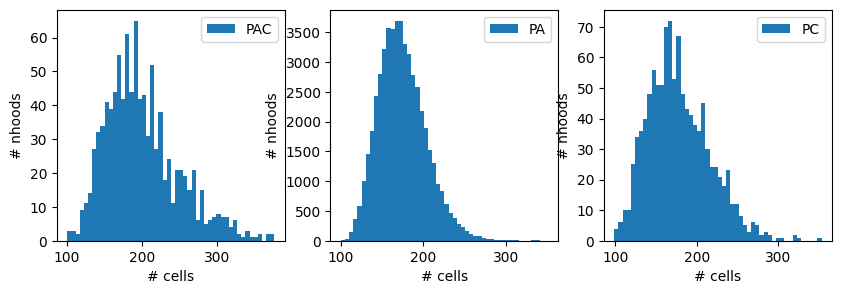

In [15]:
with rc_context({'figure.figsize':[10,3]}):
    plt.subplot(1,3,1);
    _plot_nhood_sizes(pac_design_adata, label='PAC');
    plt.legend()
    plt.subplot(1,3,2);
    _plot_nhood_sizes(pa_design_adata, label='PA');
    plt.legend()
    plt.subplot(1,3,3);
    _plot_nhood_sizes(pc_design_adata, label='PC');
    plt.legend()

In [16]:
milopy.core.count_nhoods(pac_design_adata, sample_col='sample_id')
milopy.core.count_nhoods(pa_design_adata, sample_col='sample_id')
milopy.core.count_nhoods(pc_design_adata, sample_col='sample_id')

In [ ]:
# ### Store nhood confidence

# pa_design_unc =pd.read_csv(gdrive_dir + 'uncertainty.PA_design.csv', index_col=0)
# pac_design_unc=pd.read_csv(gdrive_dir + 'uncertainty.PAC_design.csv', index_col=0)
# pc_design_unc =pd.read_csv(gdrive_dir + 'uncertainty.PC_design.csv', index_col=0)

# pac_design_adata.obs['pred_unc'] = pac_design_unc.pred_unc
# pa_design_adata.obs['pred_unc'] = pa_design_unc.pred_unc
# pc_design_adata.obs['pred_unc'] = pc_design_unc.pred_unc

# ## Convert to confidence
# pac_design_adata.obs['conf_score'] = 1 - pac_design_adata.obs['pred_unc']
# pa_design_adata.obs['conf_score'] = 1 - pa_design_adata.obs['pred_unc']
# pc_design_adata.obs['conf_score'] = 1 - pc_design_adata.obs['pred_unc']

# diff2atlas.nhood_confidence(pac_design_adata, confidence_col='conf_score', sample_col='sample_id', impute_missing=False)
# diff2atlas.nhood_confidence(pa_design_adata, confidence_col='conf_score', sample_col='sample_id', impute_missing=False)
# diff2atlas.nhood_confidence(pc_design_adata, confidence_col='conf_score', sample_col='sample_id', impute_missing=False)

### Annotate neighbourhoods
Using labels from control samples

In [17]:
milopy.utils.annotate_nhoods(pac_design_adata[pac_design_adata.obs['dataset_group'] == 'ctrl'], 'cell_type')
milopy.utils.annotate_nhoods(pa_design_adata[pa_design_adata.obs['dataset_group'] == 'atlas'], 'cell_type')
milopy.utils.annotate_nhoods(pc_design_adata[pc_design_adata.obs['dataset_group'] == 'ctrl'], 'cell_type')

... storing 'nhood_annotation' as categorical


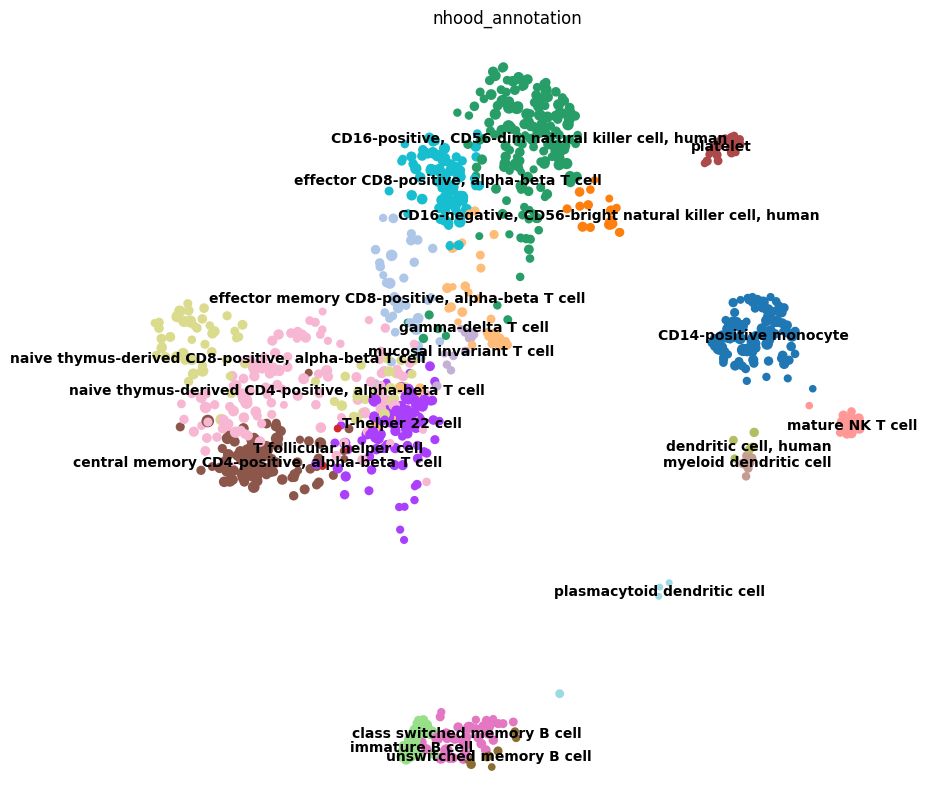

... storing 'nhood_annotation' as categorical


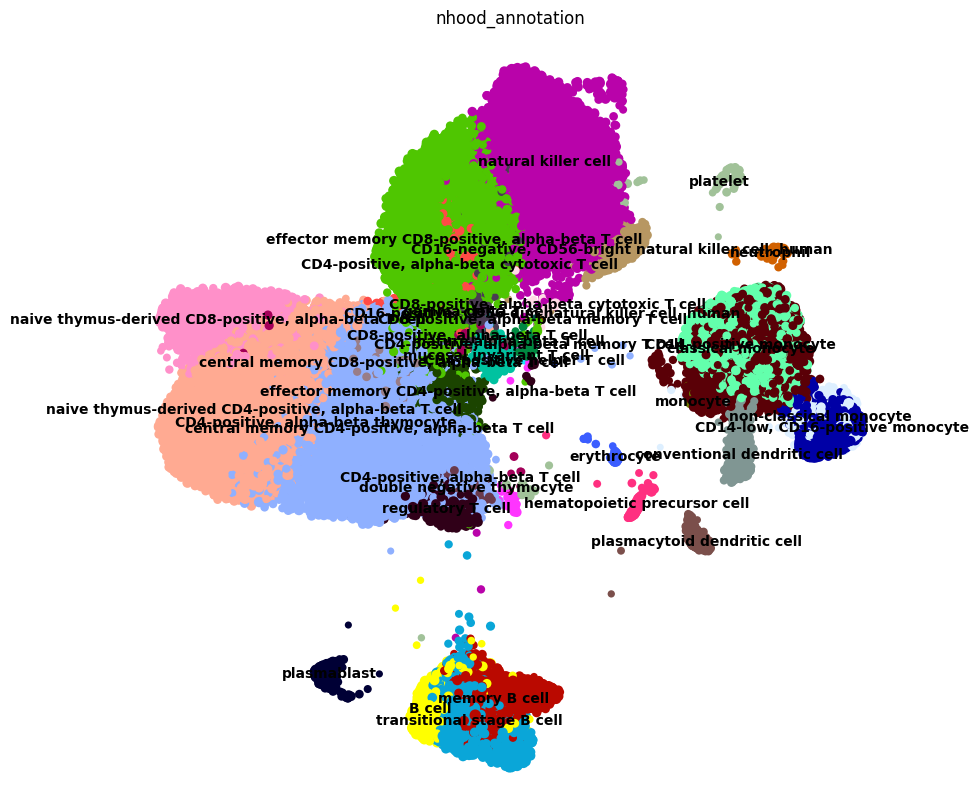

... storing 'nhood_annotation' as categorical


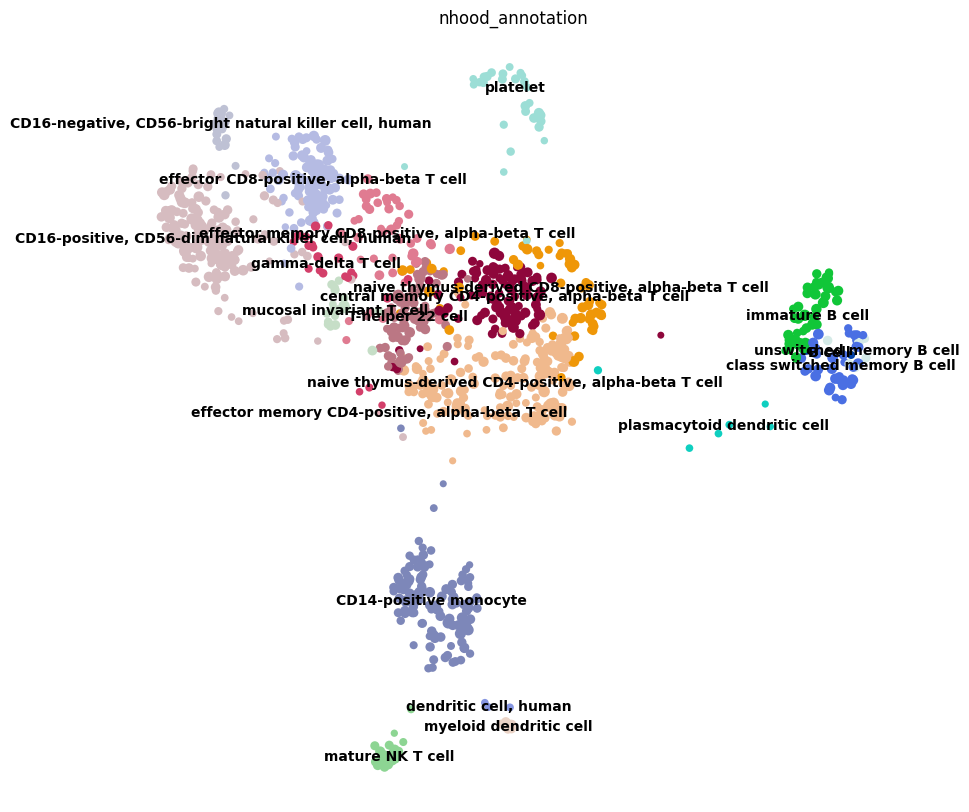

In [18]:
with rc_context({'figure.figsize':[10,10]}):
    diff2atlas.plotting.plot_nhood_graph(pac_design_adata, min_size=1, color='nhood_annotation', legend_loc='on data')
    diff2atlas.plotting.plot_nhood_graph(pa_design_adata, min_size=1, color='nhood_annotation', legend_loc='on data')
    diff2atlas.plotting.plot_nhood_graph(pc_design_adata, min_size=1, color='nhood_annotation', legend_loc='on data')

### Compute DA logFC per neighbourhood

In [19]:
pac_design_adata.obs['is_query'] = pac_design_adata.obs['dataset_group'] == 'query'
pc_design_adata.obs['is_query'] = pc_design_adata.obs['dataset_group'] == 'query'
pa_design_adata.obs['is_query'] = pa_design_adata.obs['dataset_group'] == 'query'

In [20]:
milopy.core.DA_nhoods(pac_design_adata, design='~ is_query')
milopy.core.DA_nhoods(pc_design_adata, design='~ is_query')
milopy.core.DA_nhoods(pa_design_adata, design='~ is_query')

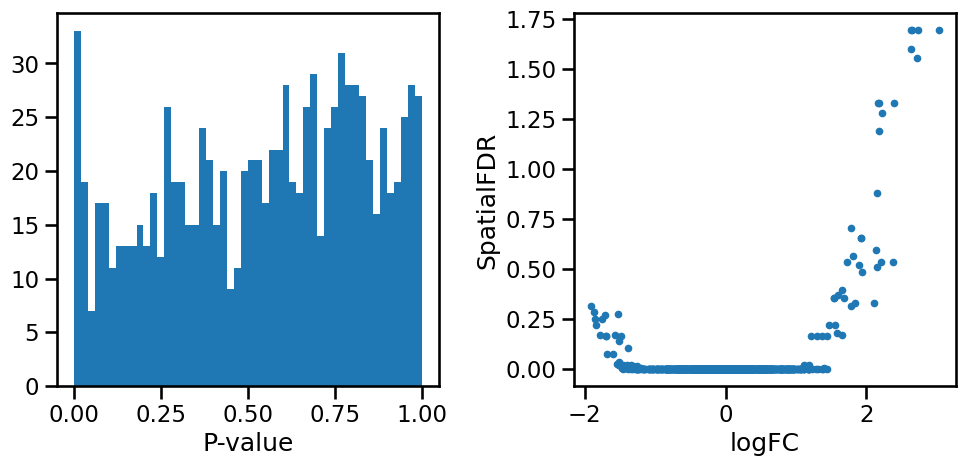

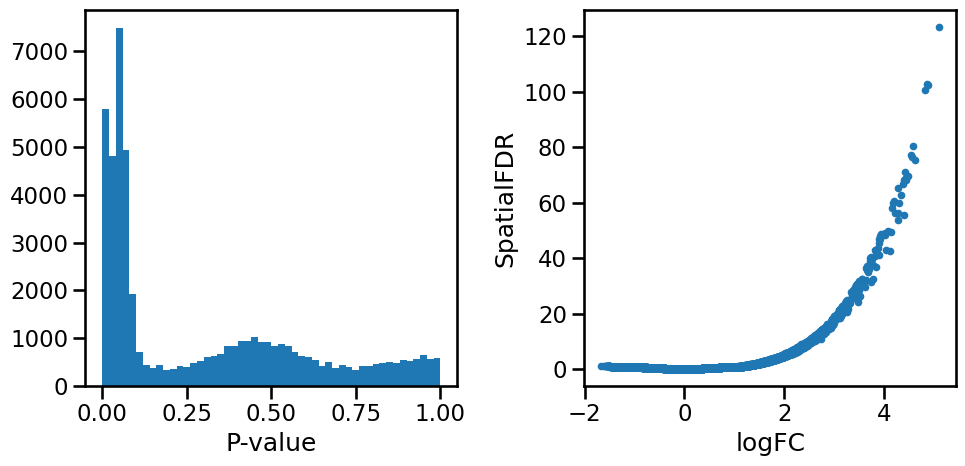

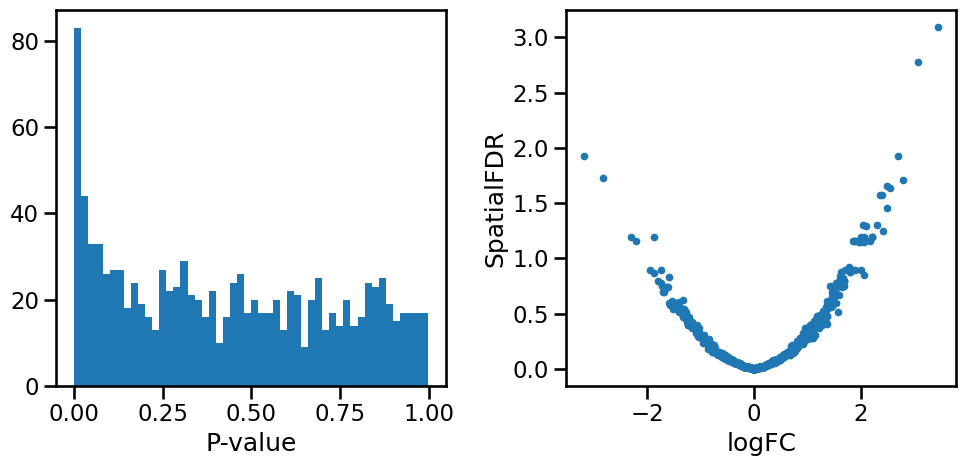

In [21]:
def plot_DA_checks(pac_design_adata):
    lfc = get_nhood_adata(pac_design_adata).obs['logFC']
    FDR_perc = -np.log10(get_nhood_adata(pac_design_adata).obs['SpatialFDR'])
    pvals = get_nhood_adata(pac_design_adata).obs['PValue']
    plt.subplot(1,2,1);
    plt.hist(pvals, bins=50);
    plt.xlabel('P-value');
    plt.subplot(1,2,2);
    plt.plot(lfc, FDR_perc, '.');
    plt.ylabel('SpatialFDR');
    plt.xlabel('logFC');
    plt.tight_layout();
    plt.show()

sns.set_context('talk');
with rc_context({'figure.figsize':[10,5]}):
    plot_DA_checks(pac_design_adata)
    plot_DA_checks(pa_design_adata)
    plot_DA_checks(pc_design_adata)

In [22]:
milopy.utils.build_nhood_graph(pac_design_adata)
milopy.utils.build_nhood_graph(pc_design_adata)
milopy.utils.build_nhood_graph(pa_design_adata)

... storing 'nhood_annotation' as categorical


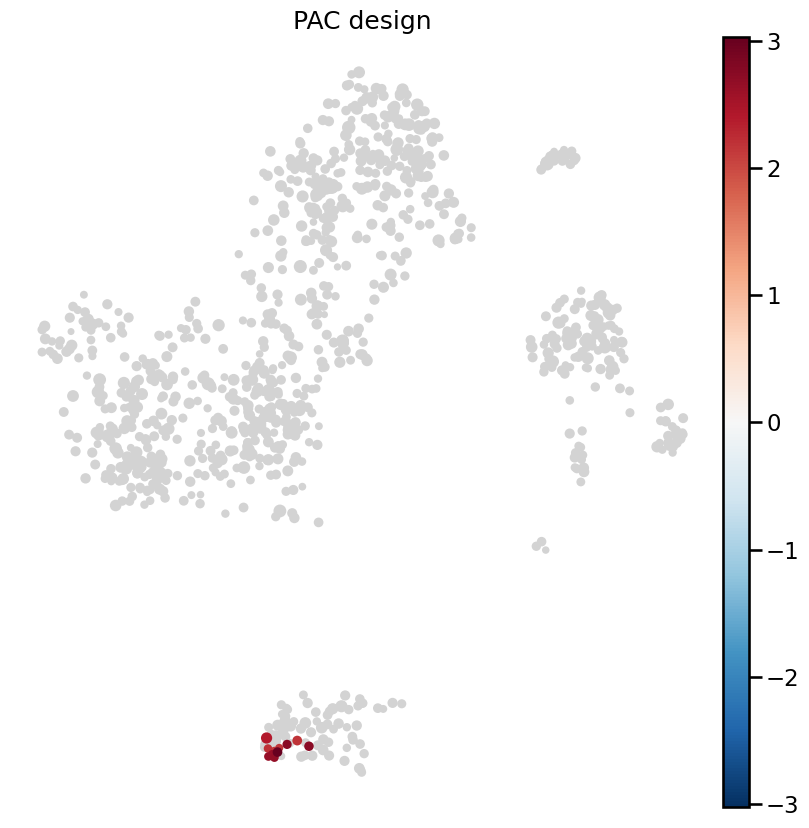

... storing 'nhood_annotation' as categorical


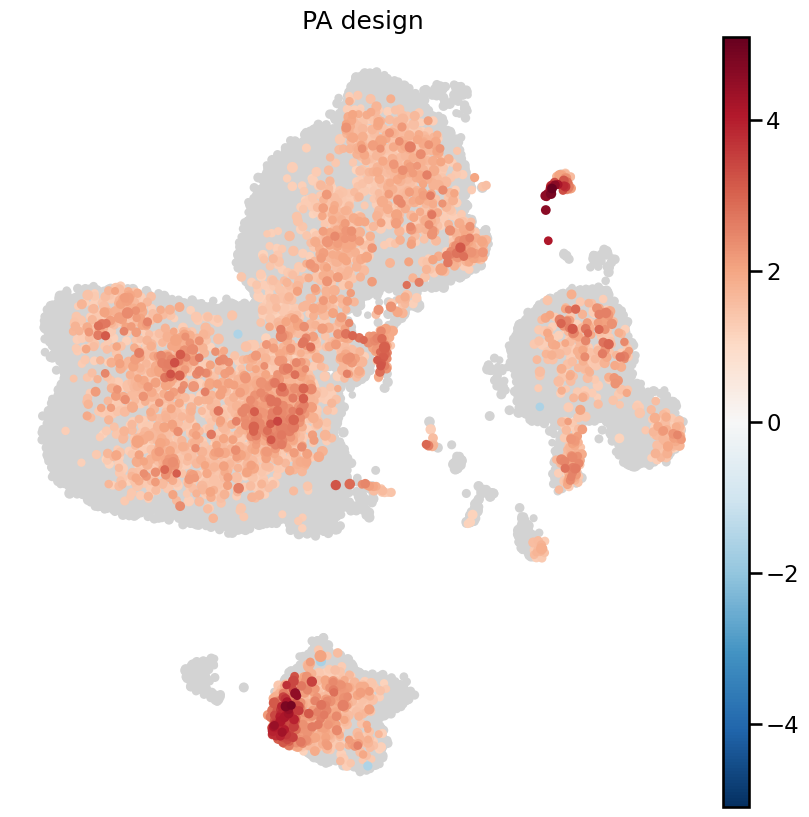

... storing 'nhood_annotation' as categorical


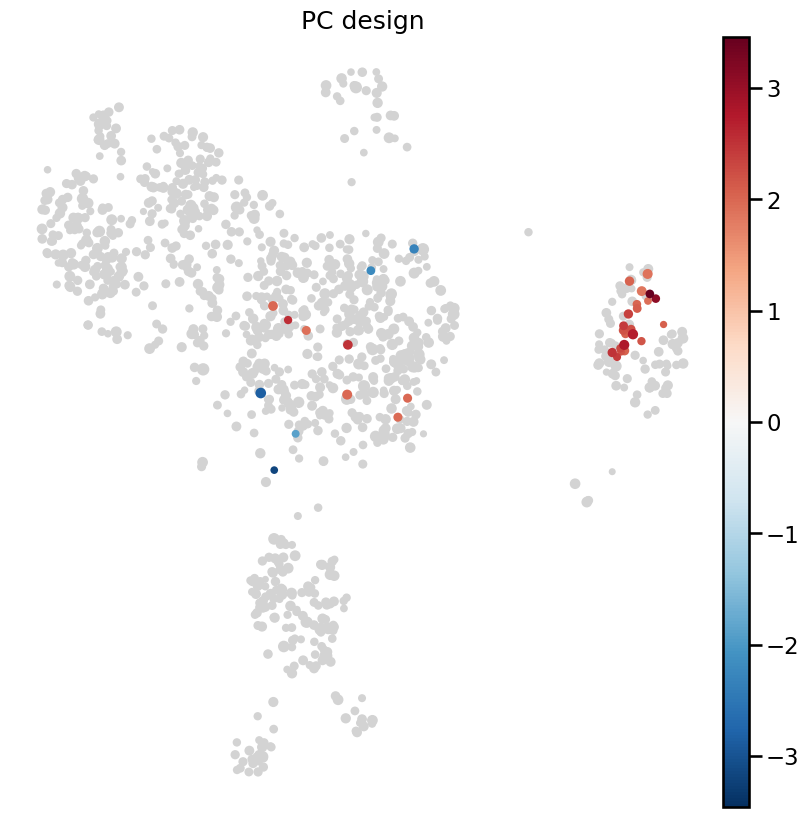

In [23]:
with rc_context({'figure.figsize':[10,10]}):
    milopy.plot.plot_nhood_graph(pac_design_adata, min_size=1, title='PAC design')
    milopy.plot.plot_nhood_graph(pa_design_adata, min_size=1, title='PA design')
    milopy.plot.plot_nhood_graph(pc_design_adata, min_size=1, title='PC design')


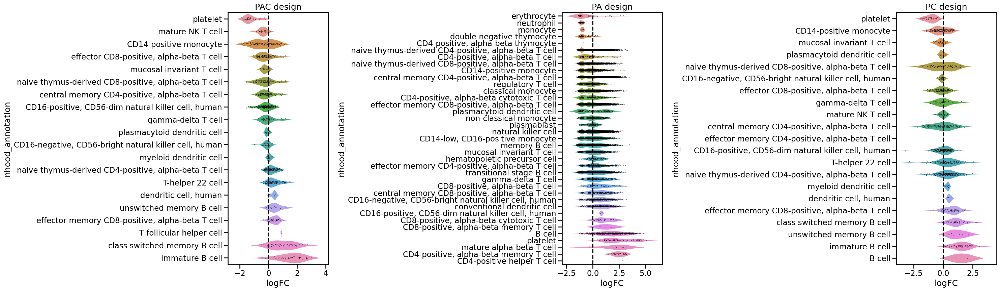

In [24]:
with rc_context({'figure.figsize':[30,9]}):
    plt.subplot(1,3,1);
    milopy.plot.plot_DA_beeswarm(pac_design_adata);
    plt.title('PAC design');
    plt.subplot(1,3,2);
    milopy.plot.plot_DA_beeswarm(pa_design_adata);
    plt.title('PA design');
    plt.subplot(1,3,3);
    milopy.plot.plot_DA_beeswarm(pc_design_adata);
    plt.title('PC design');
    plt.tight_layout()

### Confidence metrics
- **Is the confidence lower for cells in true query specific state?** compared to the rest of the cells --> expectation: no difference, because the confidence scores are primarily cell type dependent

In [63]:
def _gauss_kernel(dist_nns):
    # compute standard deviation
    std_d = np.sqrt(sum(np.sqrt(dist_nns))/dist_nns.shape[0])
    # apply gaussian kernel
    adj_dist_nns = np.exp(-dist_nns/np.square(2/std_d))
    return(adj_dist_nns)

pac_design_adata.obs['uncertainty_z'] = 1 - _gauss_kernel(pac_design_adata.obs['uncertainty_z'])

In [64]:
pac_design_adata.obs['conf_labels'] = 1 - pac_design_adata.obs['uncertainty_labels']
pac_design_adata.obs['conf_gex'] = 1 - pac_design_adata.obs['uncertainty_gex']
pac_design_adata.obs['conf_z'] = 1 - pac_design_adata.obs['uncertainty_z']

pa_design_adata.obs['conf_labels'] = 1 - pa_design_adata.obs['uncertainty_labels']
pa_design_adata.obs['conf_gex'] = 1 - pa_design_adata.obs['uncertainty_gex']
pa_design_adata.obs['conf_z'] = 1 - pa_design_adata.obs['uncertainty_z']

pc_design_adata.obs['conf_labels'] = 1 - pc_design_adata.obs['uncertainty_labels']
pc_design_adata.obs['conf_gex'] = 1 - pc_design_adata.obs['uncertainty_gex']
pc_design_adata.obs['conf_z'] = 1 - pc_design_adata.obs['uncertainty_z']


In [217]:
## Define true positive neighbourhoods (containing query specific pop)
population_obs = 'cell_type'
perturb_pop = ['naive B cell']
perturb_nhoods = pac_design_adata.obsm['nhoods'][pac_design_adata.obs[population_obs].isin(perturb_pop)].toarray().sum(0) > 10

pac_design_adata.obs['is_perturb_pop'] = pac_design_adata.obs[population_obs].isin(perturb_pop).astype('category')
pac_design_adata.uns['nhood_adata'].obs['is_perturb_nhood'] = perturb_nhoods
pac_design_adata.uns['nhood_adata'].obs['n_perturb_cells'] = pac_design_adata.obsm['nhoods'][pac_design_adata.obs[population_obs].isin(perturb_pop)].toarray().sum(0)

... storing 'is_query' as categorical


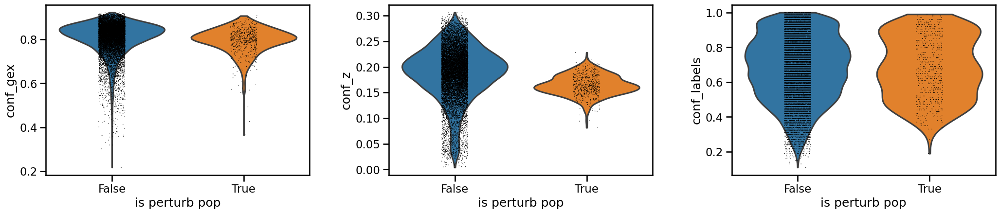

In [218]:
sc.pl.violin(pac_design_adata, ['conf_gex', 'conf_z', 'conf_labels'], groupby='is_perturb_pop')

- **Is the confidence lower in nhoods with true query specific states?** compared to the rest of the neighbourhoods --> expectation: no difference, because the confidence scores are primarily cell type (hence nhood) dependent

In [219]:
## Compute mean confidence for query cells 
# get_nhood_adata(pac_design_adata)
def get_mean_confidence_x_nhood(adata, obs_names, confidence_col = 'conf_gex'):
    '''
    Compute average confidence per neighbourhood using a subset of cells
    '''
    nhood_mat = adata[obs_names].obsm['nhoods']
    mean_conf_nhoods = nhood_mat.T.dot(
            scipy.sparse.csr_matrix(adata.obs.loc[obs_names, confidence_col]).T)
    mean_conf_nhoods = mean_conf_nhoods.toarray()/np.array(nhood_mat.T.sum(1))
    mean_conf_nhoods = np.nan_to_num(mean_conf_nhoods, 0) ## zero confidence where we have no cells
    return(mean_conf_nhoods)


get_nhood_adata(pac_design_adata).obs['conf_gex_KO'] = get_mean_confidence_x_nhood(
    pac_design_adata, obs_names = pac_design_adata.obs_names[pac_design_adata.obs['dataset_group'] == 'query'])
get_nhood_adata(pa_design_adata).obs['conf_gex_KO'] = get_mean_confidence_x_nhood(
    pa_design_adata, obs_names = pa_design_adata.obs_names[pa_design_adata.obs['dataset_group'] == 'query'])
get_nhood_adata(pc_design_adata).obs['conf_gex_KO'] = get_mean_confidence_x_nhood(
    pc_design_adata, obs_names = pc_design_adata.obs_names[pc_design_adata.obs['dataset_group'] == 'query'])


get_nhood_adata(pac_design_adata).obs['conf_labels_KO'] = get_mean_confidence_x_nhood(
    pac_design_adata, obs_names = pac_design_adata.obs_names[pac_design_adata.obs['dataset_group'] == 'query'],
    confidence_col='conf_labels'
)
get_nhood_adata(pa_design_adata).obs['conf_labels_KO'] = get_mean_confidence_x_nhood(
    pa_design_adata, obs_names = pa_design_adata.obs_names[pa_design_adata.obs['dataset_group'] == 'query'],
    confidence_col='conf_labels'
)
get_nhood_adata(pc_design_adata).obs['conf_labels_KO'] = get_mean_confidence_x_nhood(
    pc_design_adata, obs_names = pc_design_adata.obs_names[pc_design_adata.obs['dataset_group'] == 'query'],
    confidence_col='conf_labels'
)

get_nhood_adata(pac_design_adata).obs['conf_z_KO'] = get_mean_confidence_x_nhood(
    pac_design_adata, obs_names = pac_design_adata.obs_names[pac_design_adata.obs['dataset_group'] == 'query'],
    confidence_col='conf_z'
)
get_nhood_adata(pa_design_adata).obs['conf_z_KO'] = get_mean_confidence_x_nhood(
    pa_design_adata, obs_names = pa_design_adata.obs_names[pa_design_adata.obs['dataset_group'] == 'query'],
    confidence_col='conf_z'
)
get_nhood_adata(pc_design_adata).obs['conf_z_KO'] = get_mean_confidence_x_nhood(
    pc_design_adata, obs_names = pc_design_adata.obs_names[pc_design_adata.obs['dataset_group'] == 'query'],
    confidence_col='conf_z'
)

In [220]:
get_nhood_adata(pac_design_adata).obs['conf_gex_ctrl'] = get_mean_confidence_x_nhood(
    pac_design_adata, obs_names = pac_design_adata.obs_names[pac_design_adata.obs['dataset_group'] != 'query'])
get_nhood_adata(pa_design_adata).obs['conf_gex_ctrl'] = get_mean_confidence_x_nhood(
    pa_design_adata, obs_names = pa_design_adata.obs_names[pa_design_adata.obs['dataset_group'] != 'query'])
get_nhood_adata(pc_design_adata).obs['conf_gex_ctrl'] = get_mean_confidence_x_nhood(
    pc_design_adata, obs_names = pc_design_adata.obs_names[pc_design_adata.obs['dataset_group'] != 'query'])

get_nhood_adata(pac_design_adata).obs['conf_labels_ctrl'] = get_mean_confidence_x_nhood(
    pac_design_adata, obs_names = pac_design_adata.obs_names[pac_design_adata.obs['dataset_group'] != 'query'],
    confidence_col='conf_labels'
)
get_nhood_adata(pa_design_adata).obs['conf_labels_ctrl'] = get_mean_confidence_x_nhood(
    pa_design_adata, obs_names = pa_design_adata.obs_names[pa_design_adata.obs['dataset_group'] != 'query'],
    confidence_col='conf_labels'
)
get_nhood_adata(pc_design_adata).obs['conf_labels_ctrl'] = get_mean_confidence_x_nhood(
    pc_design_adata, obs_names = pc_design_adata.obs_names[pc_design_adata.obs['dataset_group'] != 'query'],
    confidence_col='conf_labels'
)

get_nhood_adata(pac_design_adata).obs['conf_z_ctrl'] = get_mean_confidence_x_nhood(
    pac_design_adata, obs_names = pac_design_adata.obs_names[pac_design_adata.obs['dataset_group'] != 'query'],
    confidence_col='conf_z'
)
get_nhood_adata(pa_design_adata).obs['conf_z_ctrl'] = get_mean_confidence_x_nhood(
    pa_design_adata, obs_names = pa_design_adata.obs_names[pa_design_adata.obs['dataset_group'] != 'query'],
    confidence_col='conf_z'
)
get_nhood_adata(pc_design_adata).obs['conf_z_ctrl'] = get_mean_confidence_x_nhood(
    pc_design_adata, obs_names = pc_design_adata.obs_names[pc_design_adata.obs['dataset_group'] != 'query'],
    confidence_col='conf_z'
)

In [290]:
pac_nhood_obs = get_nhood_adata(pac_design_adata).obs.copy()
pac_nhood_obs['is_perturb_nhood'] = pac_nhood_obs['is_perturb_nhood'].astype('str')

In [291]:
%%R -i pac_nhood_obs
dim(pac_nhood_obs)

[1] 833  25


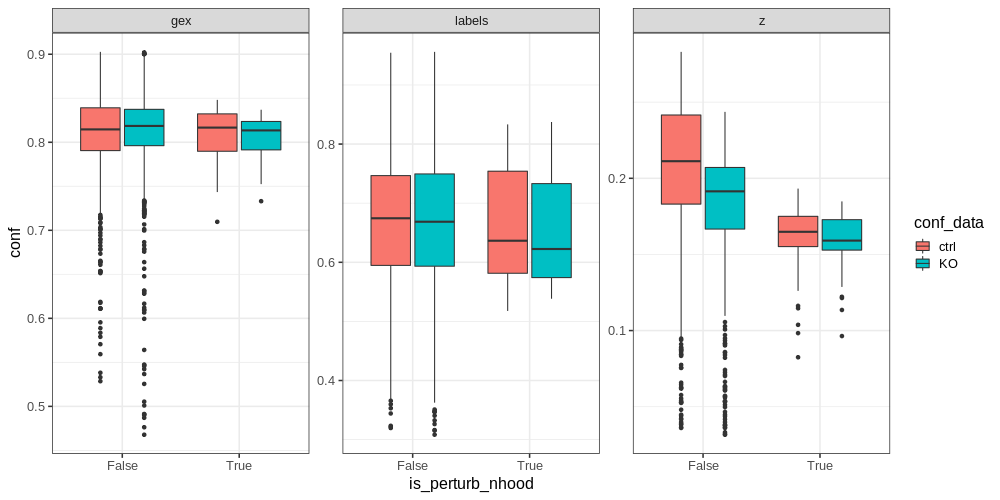

In [292]:
%%R -w 1000 -h 500
pac_nhood_obs %>%
pivot_longer(
    cols=c('conf_z_KO', 'conf_z_ctrl', 'conf_gex_KO', 'conf_gex_ctrl', 'conf_labels_KO', 'conf_labels_ctrl'),
    names_to='conf_type',
    values_to='conf') %>%
mutate(conf_stat = str_remove(str_remove(conf_type, 'conf_'), '_.+'),
      conf_data = str_remove(str_remove(conf_type, 'conf_'), '.+_')) %>%
ggplot(aes(is_perturb_nhood, conf, fill=conf_data)) +
    geom_boxplot() +
    facet_wrap(.~conf_stat, scales='free_y') +
    theme_bw(base_size=16)

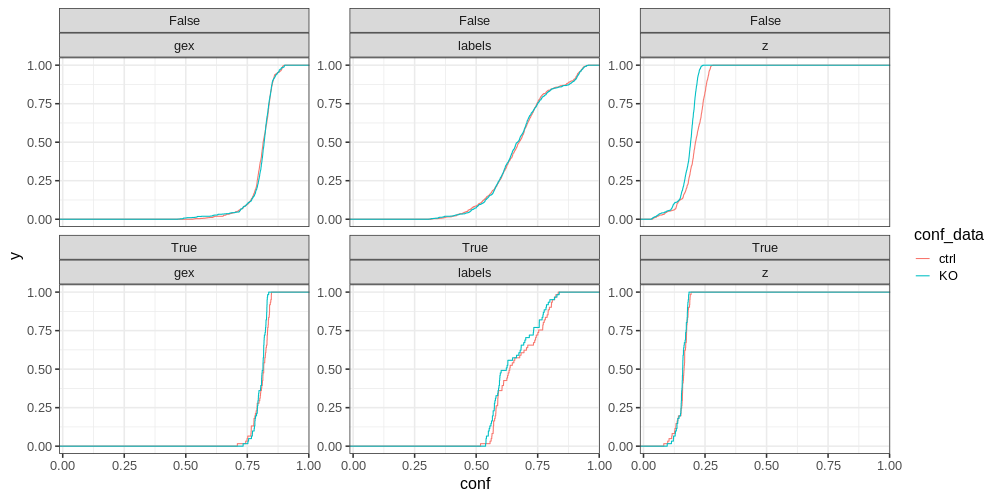

In [295]:
%%R -w 1000 -h 500
pac_nhood_obs %>%
pivot_longer(
    cols=c('conf_z_KO', 'conf_z_ctrl', 'conf_gex_KO', 'conf_gex_ctrl', 'conf_labels_KO', 'conf_labels_ctrl'),
    names_to='conf_type',
    values_to='conf') %>%
mutate(conf_stat = str_remove(str_remove(conf_type, 'conf_'), '_.+'),
      conf_data = str_remove(str_remove(conf_type, 'conf_'), '.+_')) %>%
ggplot(aes( conf, color=conf_data)) +
    stat_ecdf() +
    facet_wrap(is_perturb_nhood~conf_stat, scales='free_y') +
    theme_bw(base_size=16)

- **Is the confidence lower for query cells in nhoods with true query specific states?** compared to confidence of control cells --> expectation: confidence should be lower for query samples compared to ctrl samples

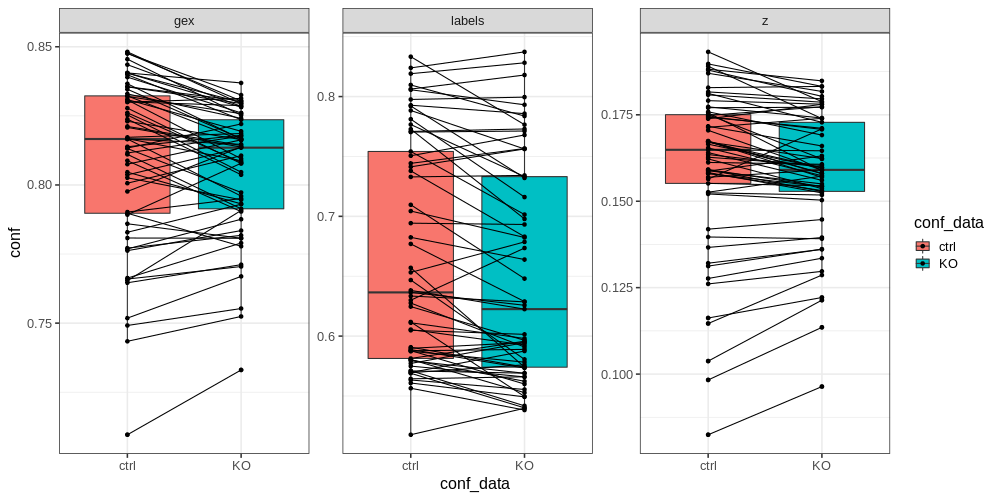

In [224]:
%%R -w 1000 -h 500
pac_nhood_obs %>%
pivot_longer(
    cols=c('conf_z_KO', 'conf_z_ctrl', 'conf_gex_KO', 'conf_gex_ctrl', 'conf_labels_KO', 'conf_labels_ctrl'),
    names_to='conf_type',
    values_to='conf') %>%
mutate(conf_stat = str_remove(str_remove(conf_type, 'conf_'), '_.+'),
      conf_data = str_remove(str_remove(conf_type, 'conf_'), '.+_')) %>%
filter(is_perturb_nhood == TRUE) %>%
ggplot(aes(conf_data, conf, fill=conf_data)) +
    geom_boxplot() +
    geom_point() +
    geom_line(aes(group=index_cell)) +
    facet_wrap(.~conf_stat, scales='free_y') +
    theme_bw(base_size=16)

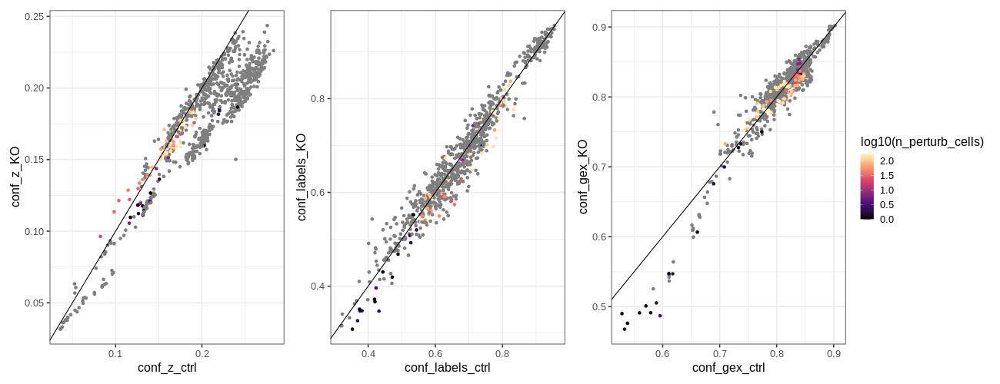

In [225]:
%%R -w 1300 -h 500
pac_nhood_obs %>%
ggplot(aes(conf_z_ctrl, conf_z_KO, color=log10(n_perturb_cells))) +
    geom_point() +
    geom_abline() +
    scale_color_viridis_c(option='magma') +
    theme_bw(base_size=16) +

pac_nhood_obs %>%
ggplot(aes(conf_labels_ctrl, conf_labels_KO, color=log10(n_perturb_cells))) +
    geom_point() +
    geom_abline() +
    scale_color_viridis_c(option='magma') +
    theme_bw(base_size=16) +

pac_nhood_obs %>%
arrange(n_perturb_cells) %>%
ggplot(aes(conf_gex_ctrl, conf_gex_KO, color=log10(n_perturb_cells))) +
    geom_point() +
    geom_abline() +
    scale_color_viridis_c(option='magma') +
    theme_bw(base_size=16) +
plot_layout(guides='collect')

In [387]:

nhood_conf_var = np.nanvar(conf_df['conf_z'])
nhood_conf_mean = np.nanmean(conf_df['conf_z'])

# lowess = sm.nonparametric.lowess
# z = lowess(nhood_conf_var, nhood_conf_mean)
# # Keep neighbourhoods with std higher than expected by the mean
# nhood_adata.obs['confidence_mean'] = nhood_conf_mean
# nhood_adata.obs['confidence_var'] = nhood_conf_var
# nhood_adata.obsm['confidence_var_lowess'] = z
# nhood_adata.obs['highly_variable'] = nhood_conf_var > z[:, 1]
# adata.uns['nhood_adata'] = nhood_adata.copy()

In [416]:
def get_nhood_cells(adata, nhood_ix):
    return(adata.obsm["nhoods"][:, nhood_ix].toarray().ravel() > 0)

In [436]:
def calc_nhood_conf_stats(adata, conf_score='conf_z', stat='std'):
    conf_vars = []
    for i,n in enumerate(get_nhood_adata(adata).obs_names):
        if stat == 'std':
            conf_vars.append(np.nanvar(adata.obs.loc[get_nhood_cells(adata, i), conf_score]))
        if stat == 'mean':
            conf_vars.append(np.nanmean(adata.obs.loc[get_nhood_cells(adata, i), conf_score]))
    return(conf_vars)
    

In [437]:
pac_design_adata.uns['nhood_adata'].obs['variance_from_cells'] = calc_nhood_conf_stats(pac_design_adata)
pac_design_adata.uns['nhood_adata'].obs['mean_from_cells'] = calc_nhood_conf_stats(pac_design_adata, stat='mean')

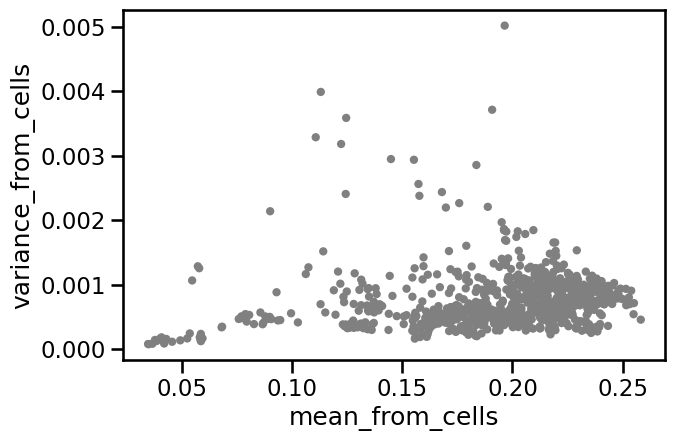

In [438]:
sc.pl.scatter(get_nhood_adata(pac_design_adata), 'mean_from_cells', 'variance_from_cells')

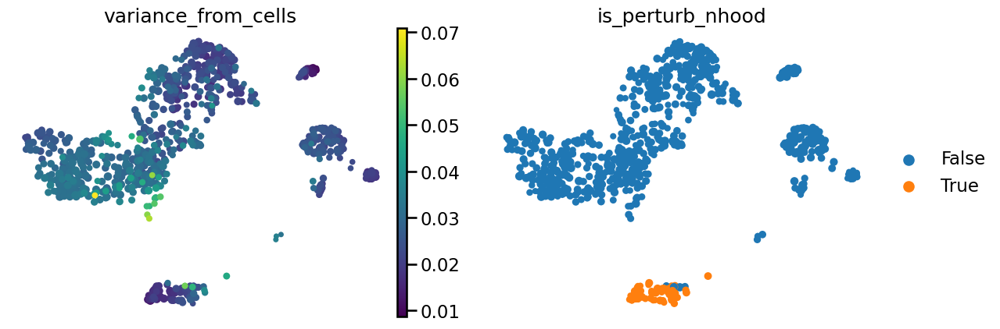

In [427]:
diff2atlas.plotting.plot_nhood_graph(pac_design_adata, color=['variance_from_cells', 'is_perturb_nhood'], min_size=1)

In [330]:
get_nhood_adata(pac_design_adata).obs_names[get_nhood_adata(pac_design_adata).obs['is_perturb_nhood']]

Index(['79', '185', '226', '232', '240', '251', '257', '367', '392', '395',
       '412', '414', '430', '514', '518', '528', '530', '534', '536', '542',
       '546', '559', '561', '616', '642', '653', '654', '690', '692', '732',
       '733', '734', '735', '736', '738', '740', '742', '744', '750', '751',
       '752', '754', '755', '758', '761', '763', '765', '772', '783', '793',
       '803', '805', '810', '813', '874', '884', '916', '956', '972', '974',
       '992'],
      dtype='object')

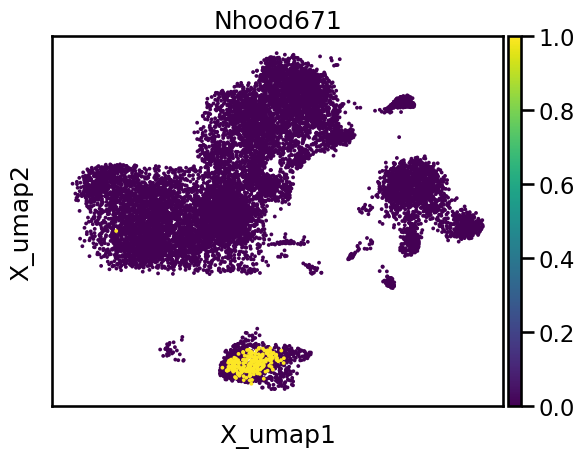

In [593]:
## Take one nhood
o = 803
i = np.where(get_nhood_adata(pac_design_adata).obs_names == str(o))[0][0]
milopy.plot.plot_nhood(pac_design_adata, i)
conf_df = pac_design_adata[pac_design_adata.obsm['nhoods'][:,i].toarray().flatten() > 0 ].obs[['conf_gex', 'dataset_group', 'is_perturb_pop', 'sample_id']] 
conf_df['is_perturb_pop'] = conf_df['is_perturb_pop'].astype('bool')

In [594]:
%%R -i conf_df
dim(conf_df)

[1] 207   4


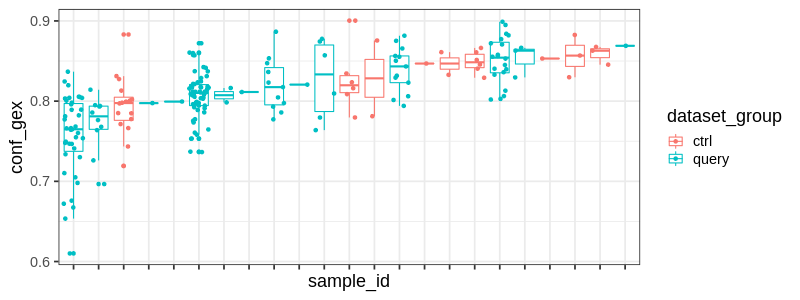

In [595]:
%%R -w 800 -h 300
conf_df %>%
group_by(sample_id) %>%
mutate(mean=mean(conf_gex)) %>%
ungroup() %>%
arrange(mean) %>%
mutate(sample_id=factor(sample_id, levels=unique(sample_id))) %>%
ggplot(aes(y=conf_gex, x=sample_id, color=dataset_group)) +
geom_boxplot() +
geom_jitter() +
theme_bw(base_size=18) +
theme(axis.text.x=element_blank())

Is the confidence in query cell lower than confidence of nearest ctrl cells? At cell instead of neigbourhood level

In [618]:
## Train weighted KNN on query cells
ctrl_adata = pac_design_adata[pac_design_adata.obs['dataset_group'] == 'ctrl'].copy()
query_adata = pac_design_adata[pac_design_adata.obs['dataset_group'] == 'query'].copy()

knn_ctrl = diff2atlas.model_wrappers.train_weighted_knn(
    ctrl_adata, n_neighbors=50
)

Weighted KNN with n_neighbors = 50 ... 

In [619]:
q_emb = query_adata.obsm['X_scVI']
top_k_indices, top_k_distances = knn_ctrl.query(q_emb,k=knn_ctrl.n_neighbors)

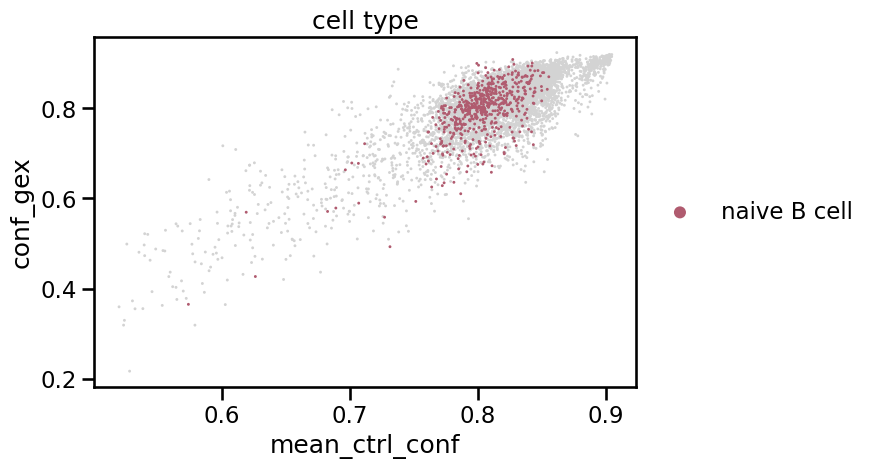

In [637]:
conf_metric = 'conf_gex'
mean_ctrl_conf = []
for i in range(query_adata.n_obs):
    mean_ctrl_conf.append(np.mean(ctrl_adata[top_k_indices[i,:]].obs[conf_metric]))

query_adata.obs['mean_ctrl_conf'] = mean_ctrl_conf
sc.pl.scatter(query_adata, 'mean_ctrl_conf', conf_metric, 
              color='cell_type', groups=perturb_pop)

In [632]:
conf_metric = 'conf_labels'
mean_ctrl_conf = []
for i in range(query_adata.n_obs):
    mean_ctrl_conf.append(np.mean(ctrl_adata[top_k_indices[i,:]].obs[conf_metric]))

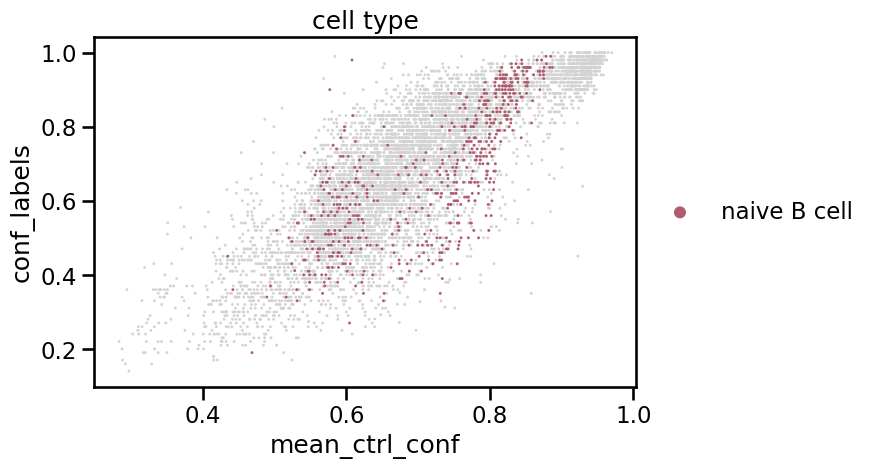

In [633]:
query_adata.obs['mean_ctrl_conf'] = mean_ctrl_conf
sc.pl.scatter(query_adata, 'mean_ctrl_conf', conf_metric, 
              color='cell_type', groups=perturb_pop)

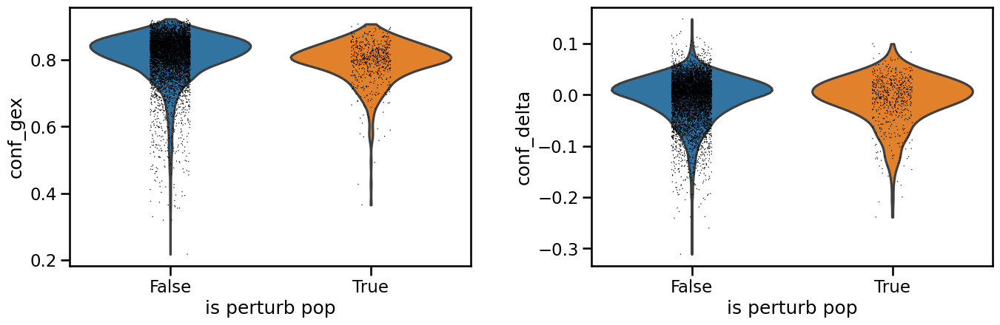

In [638]:
query_adata.obs['conf_delta'] = query_adata.obs[conf_metric] - query_adata.obs['mean_ctrl_conf'] 
sc.pl.violin(query_adata, [conf_metric, 'conf_delta'], groupby='is_perturb_pop')

In [441]:
## Run PCA on nhood counts

## Get weights (nhood x PC)

## Fit held out sample to Weights (estimates position in PC space)
# X = WZ

## What fraction of variance 

In [479]:
nhood_adata = get_nhood_adata(pac_design_adata).T.copy()
sc.pp.normalize_per_cell(nhood_adata, counts_per_cell_after=10000)
sc.pp.log1p(nhood_adata)
sc.pp.pca(nhood_adata, n_comps=10)

In [485]:
X = nhood_adata.X.toarray()
Z = nhood_adata.obsm['X_pca']
W = nhood_adata.varm['PCs']
X_atlas = get_nhood_adata(pac_design_adata).obs['size'].values.copy()
X_atlas = np.log1p((X_atlas/sum(X_atlas))*10000)
Z_atlas = X_atlas.dot(W)

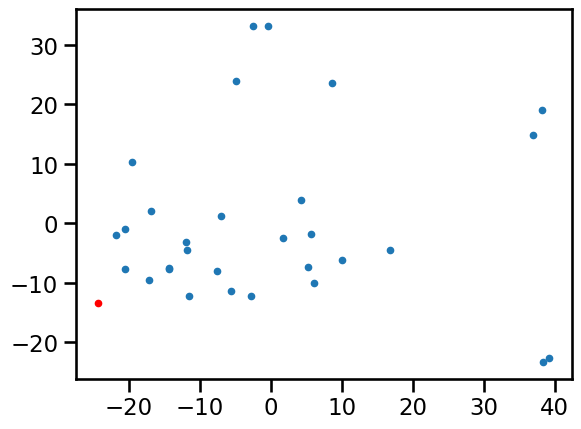

In [486]:
plt.plot(Z[:,0], Z[:,1], '.')
plt.plot(Z_atlas[0], Z_atlas[1], '.', color='red')

In [530]:
dist2atlas = scipy.spatial.distance.cdist(Z, Z_atlas.reshape(1,-1)).reshape(-1,1)
dist2samples = scipy.spatial.distance.cdist(Z, Z)
# plt.hist(dist2samples.flatten());
# plt.hist(dist2atlas.flatten());
dist_df = pd.DataFrame(np.hstack([dist2atlas, dist2samples]), columns=['atlas'] + nhood_adata.obs_names.tolist(), index=nhood_adata.obs_names.tolist())
dist_df['group'] = nhood_adata.obs['dataset_group']

In [531]:
%%R -i dist_df
dim(dist_df)

[1] 30 32


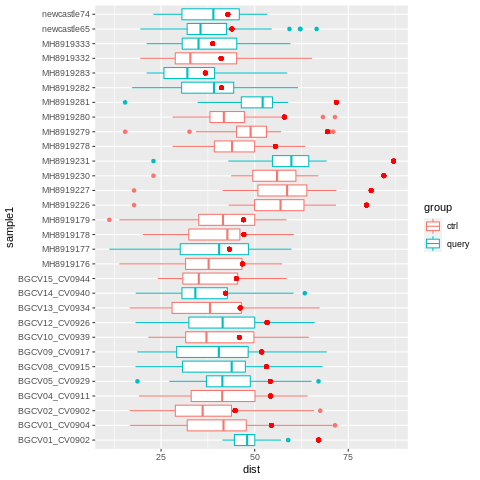

In [537]:
%%R -i dist_df
dist_df %>%
    rownames_to_column('sample1') %>%
    pivot_longer(cols=-c(atlas, sample1, group), names_to='sample', values_to='dist') %>%
    filter(dist > 0) %>%
    ggplot(aes(sample1, dist,color=group)) +
    geom_boxplot() +
    geom_point(aes(y=atlas), color='red') +
    coord_flip()

In [671]:
pa_design_adata.obs['dataset_id'] = pa_design_adata.obs['dataset_id'].str.strip('_innate')
pa_design_adata.obs['dataset_id'] = pa_design_adata.obs['dataset_id'].str.strip('_adaptive')
milopy.utils.add_covariate_to_nhoods_var(pa_design_adata, ['sex', 'dataset_id', 'dataset_group'])
nhood_adata = get_nhood_adata(pa_design_adata).T.copy()
sc.pp.normalize_per_cell(nhood_adata, counts_per_cell_after=10000)
sc.pp.log1p(nhood_adata)
sc.pp.pca(nhood_adata, n_comps=10)

... storing 'dataset_group' as categorical
... storing 'dataset_id' as categorical
... storing 'is_query' as categorical
... storing 'sex' as categorical
... storing 'nhood_annotation' as categorical


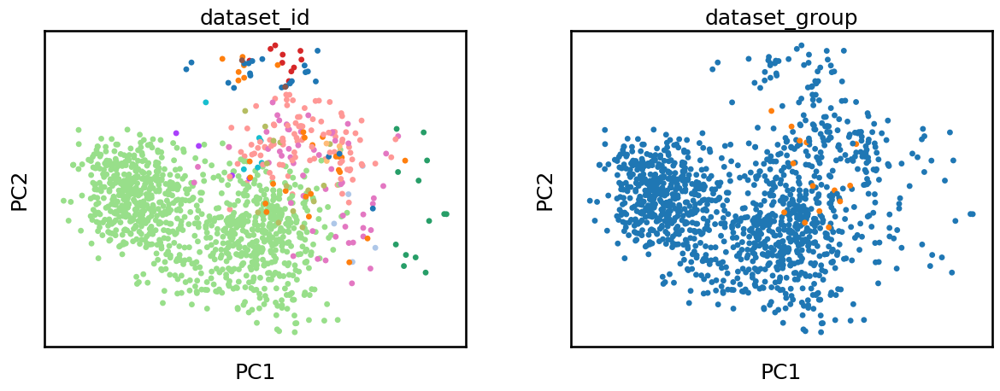

In [672]:
sc.pl.pca(nhood_adata, color=['dataset_id', 'dataset_group'], legend_loc='none')

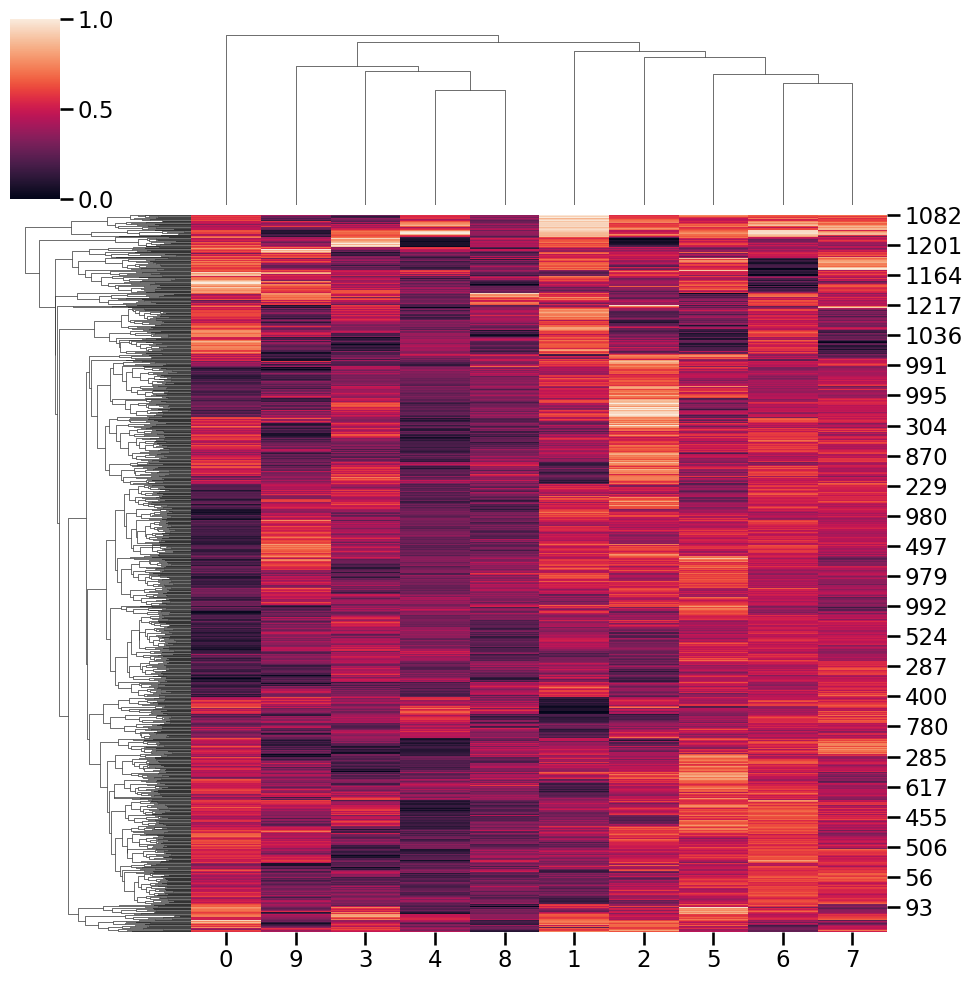

In [679]:
sns.clustermap(nhood_adata.obsm['X_pca'], standard_scale=1)

    - If yes: is it significant in any of the tests?
        - If yes: cool (biliv)
        - If no: 
            - Is the test crap?

    - If no: make boxplot but scale point size by no of cells
        - Is it the other way around? Is confidence higher for query cells?
        - Are there too few cells from control in these nhoods?
    

In [131]:
pac_design_adata.uns['nhood_adata'].uns['nhoods_key'] = 'nhoods'

## Differential uncertainty
pac_design_adata.obs['is_query'] = pac_design_adata.obs['is_query'].astype('int').astype('str')
pac_design_adata.uns['nhood_adata'].var['is_query'] = pac_design_adata.uns['nhood_adata'].var['is_query'].astype('int').astype('str')
diff2atlas.nhood_confidence(pac_design_adata, confidence_col='conf_z', sample_col='sample_id', impute_missing=False, min_cells=1)
diff2atlas.make_design(pac_design_adata, categorical_covariates=['dataset_group', 'is_query'])

Text(0, 0.5, 'confidence')

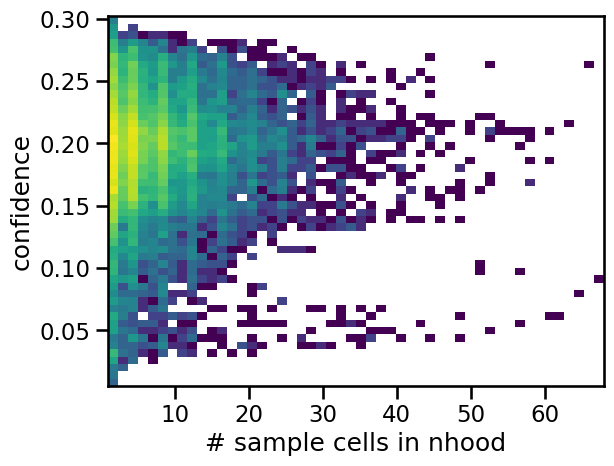

In [179]:
import matplotlib
counts = get_nhood_adata(pac_design_adata).X.toarray().flatten()
conf = get_nhood_adata(pac_design_adata).layers['confidence'].flatten()
plt.hist2d(counts[(~np.isnan(conf)) & (counts < 70)], conf[(~np.isnan(conf)) & (counts < 70)],
           norm=matplotlib.colors.LogNorm(), bins=50);
plt.xlabel("# sample cells in nhood");
plt.ylabel('confidence')

Text(0, 0.5, 'confidence')

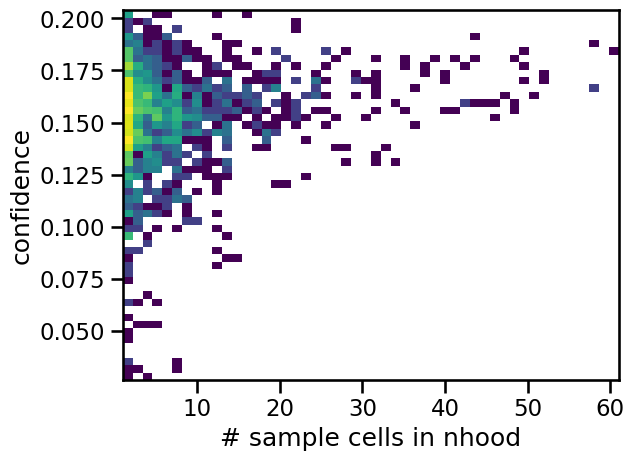

In [226]:
import matplotlib
counts = get_nhood_adata(pac_design_adata)[pac_nhood_obs.is_perturb_nhood].X.toarray().flatten()
conf = get_nhood_adata(pac_design_adata)[pac_nhood_obs.is_perturb_nhood].layers['confidence'].flatten()
plt.hist2d(counts[(~np.isnan(conf)) & (counts < 70)], conf[(~np.isnan(conf)) & (counts < 70)],
           norm=matplotlib.colors.LogNorm(), bins=50);
plt.xlabel("# sample cells in nhood");
plt.ylabel('confidence')

In [227]:
## Filter out nhoods with > 250 cells

pac_design_adata.uns['nhood_adata'].obs['size'] = pac_design_adata.obsm['nhoods'].toarray().sum(0)
pac_design_adata.obs['n_nhoods'] = pac_design_adata.obsm['nhoods'].toarray().sum(1)

In [228]:
pac_design_adata.obsm['nhoods'] = pac_design_adata.obsm['nhoods'][:, pac_design_adata.uns['nhood_adata'].obs['size'] < 250]
pac_design_adata.uns['nhood_adata'] = pac_design_adata.uns['nhood_adata'][pac_design_adata.uns['nhood_adata'].obs['size'] < 250]

In [229]:
pac_design_adata.obs['n_nhoods'] = pac_design_adata.obsm['nhoods'].toarray().sum(1)

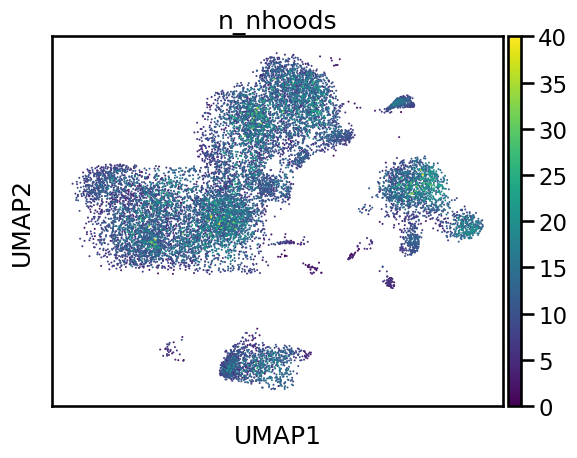

In [230]:
sc.pl.umap(pac_design_adata, color='n_nhoods')

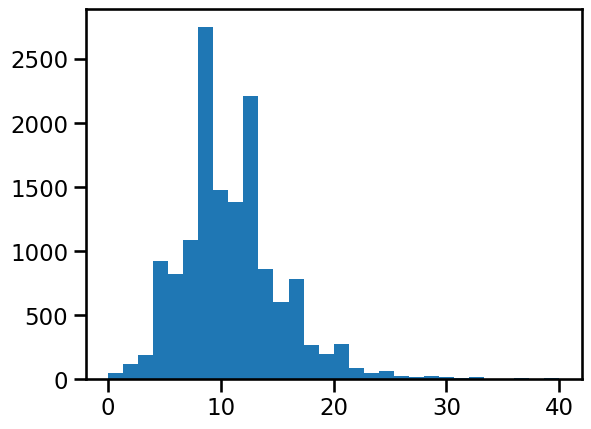

In [231]:
plt.hist(pac_design_adata.obs['n_nhoods'], bins=30);

... storing 'nhood_annotation' as categorical


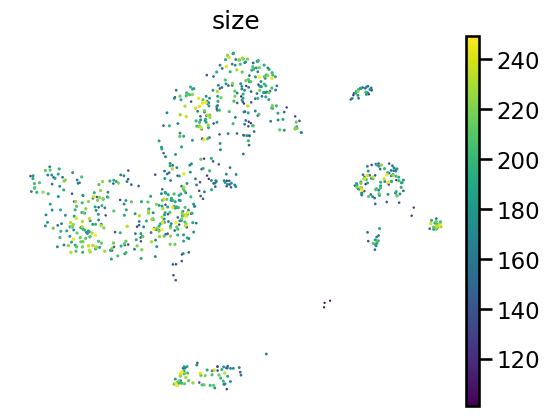

In [232]:
diff2atlas.plotting.plot_nhood_graph(pac_design_adata, color='size', min_size=0.1)

In [233]:
# diff2atlas.highly_variable_nhoods(pac_design_adata)

In [596]:
pac_design_adata.obs['is_query'] = pac_design_adata.obs['is_query'].astype('int').astype('str')
pac_design_adata.uns['nhood_adata'].var['is_query'] = pac_design_adata.uns['nhood_adata'].var['is_query'].astype('int').astype('str')
diff2atlas.nhood_confidence(pac_design_adata, confidence_col='conf_gex', sample_col='sample_id', impute_missing=False, min_cells=1)
diff2atlas.make_design(pac_design_adata, categorical_covariates=['dataset_group', 'is_query'])
diff2atlas.test_confidence(pac_design_adata, test_covariate='is_query', method='OLS', ref_level='1', use_highly_variable=False)

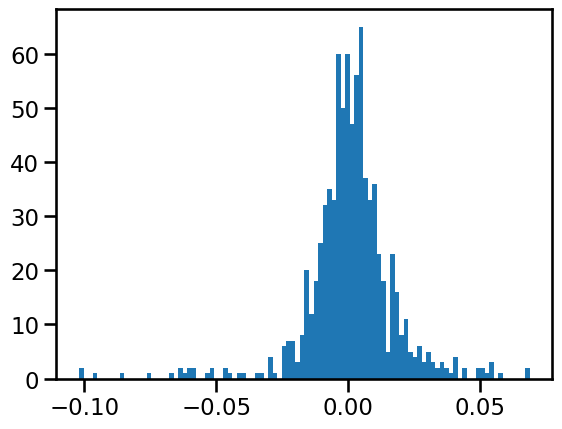

In [597]:
# plt.hist(get_nhood_adata(pac_design_adata).obs['confidence_test_pvals'], bins=100);
plt.show()
plt.hist(get_nhood_adata(pac_design_adata).obs['confidence_test_statistic'], bins=100);

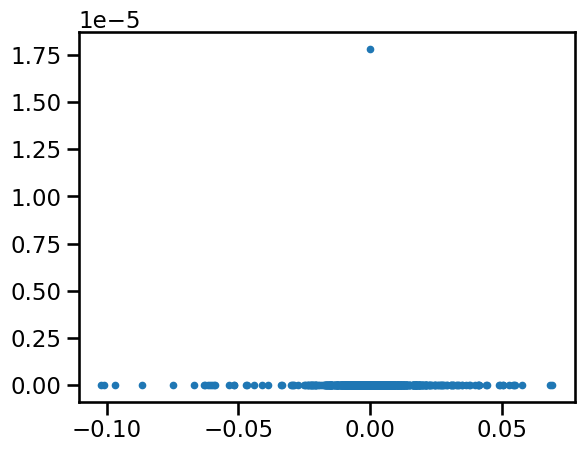

In [598]:
plt.plot(get_nhood_adata(pac_design_adata).obs['confidence_test_statistic'], 
         -np.log10(get_nhood_adata(pac_design_adata).obs['confidence_test_adj_pvals']), '.');

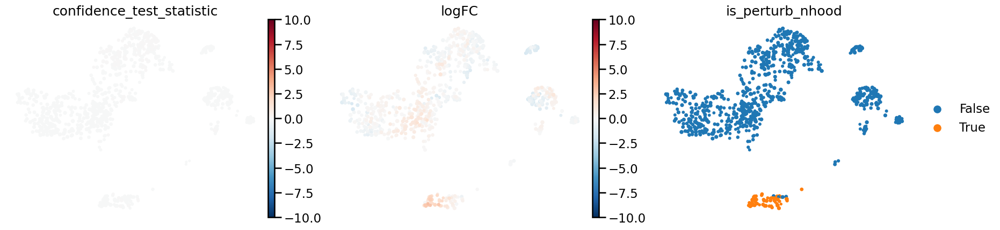

In [299]:
pac_design_adata.uns['nhood_adata'].obs['is_perturb_nhood'] = pac_design_adata.uns['nhood_adata'].obs['is_perturb_nhood'].astype('category')
diff2atlas.plotting.plot_nhood_graph(pac_design_adata, min_size=0.5, color=['confidence_test_statistic', 'logFC', 'is_perturb_nhood'], cmap='RdBu_r',
                                     vcenter=0, vmax=10, vmin=-10)

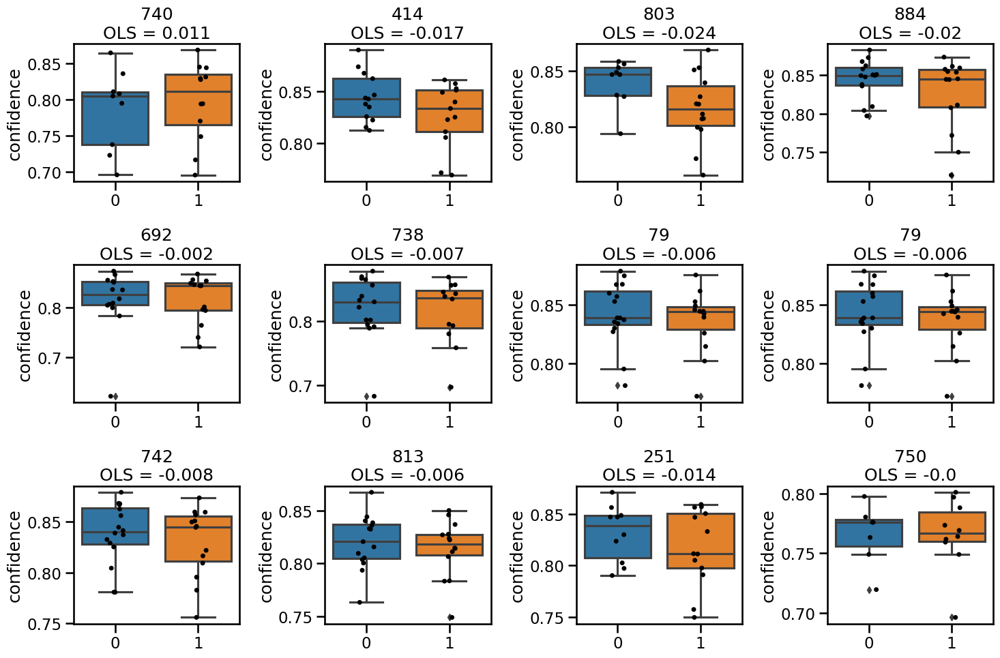

In [599]:
obs = get_nhood_adata(pac_design_adata).obs_names[get_nhood_adata(pac_design_adata).obs['is_perturb_nhood']]
with rc_context({'figure.figsize': (15, 10)}):
    diff2atlas.plotting.plot_nhood_confidence_boxplot(pac_design_adata, obs_names = np.random.choice(obs, 12), n_cols=4)

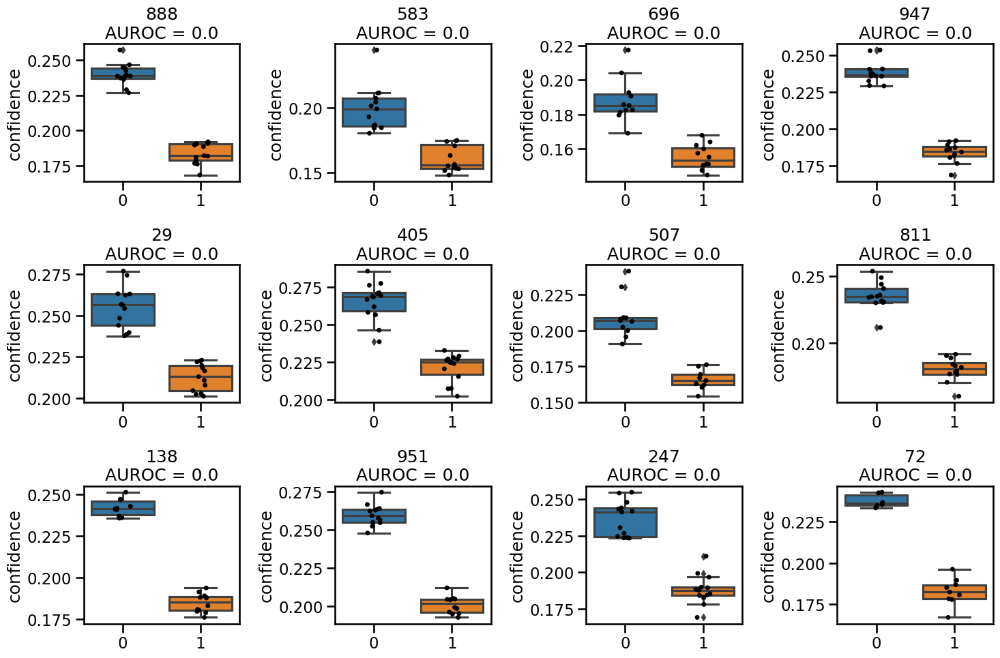

In [286]:
# obs = get_nhood_adata(pac_design_adata).obs_names[get_nhood_adata(pac_design_adata).obs['confidence_test_adj_pvals'] < 0.1]
obs = get_nhood_adata(pac_design_adata).obs_names[get_nhood_adata(pac_design_adata).obs['confidence_test_statistic'] < 0.001]
with rc_context({'figure.figsize': (15, 10)}):
    diff2atlas.plotting.plot_nhood_confidence_boxplot(pac_design_adata, obs_names = np.random.choice(obs, 12), n_cols=4)

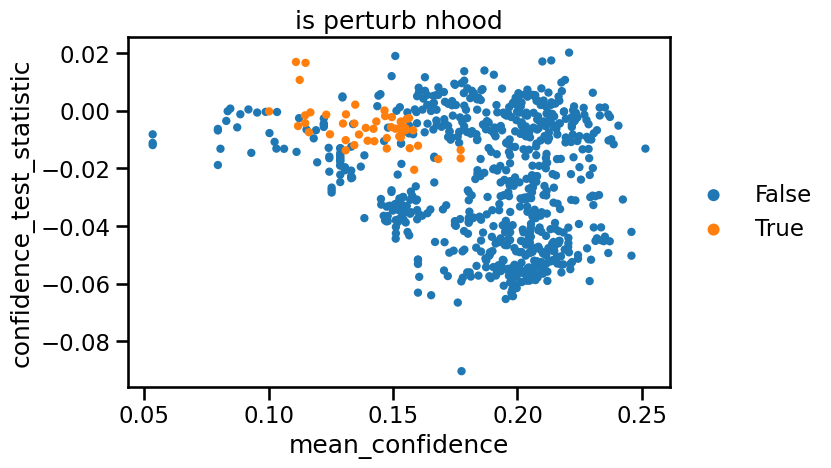

In [267]:
get_nhood_adata(pac_design_adata).obs['mean_confidence'] = get_nhood_adata(pac_design_adata)[:,10].layers['confidence'].toarray().mean(1)
get_nhood_adata(pac_design_adata).obs['sd_confidence'] = get_nhood_adata(pac_design_adata)[:,10].layers['confidence'].toarray().std(1)
sc.pl.scatter(get_nhood_adata(pac_design_adata), 'mean_confidence', 'confidence_test_statistic', color='is_perturb_nhood')

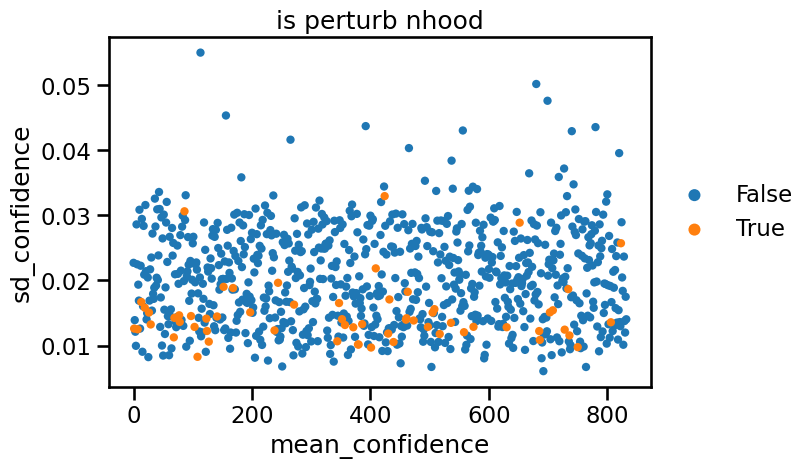

In [283]:
get_nhood_adata(pac_design_adata).obs['mean_confidence'] = np.nanmean(get_nhood_adata(pac_design_adata).layers['confidence'], 1)
get_nhood_adata(pac_design_adata).obs['sd_confidence'] = np.nanstd(get_nhood_adata(pac_design_adata).layers['confidence'], 1)
sc.pl.scatter(get_nhood_adata(pac_design_adata), 'mean_confidence', 'sd_confidence', color='is_perturb_nhood')

Text(0, 0.5, 'mean confidence')

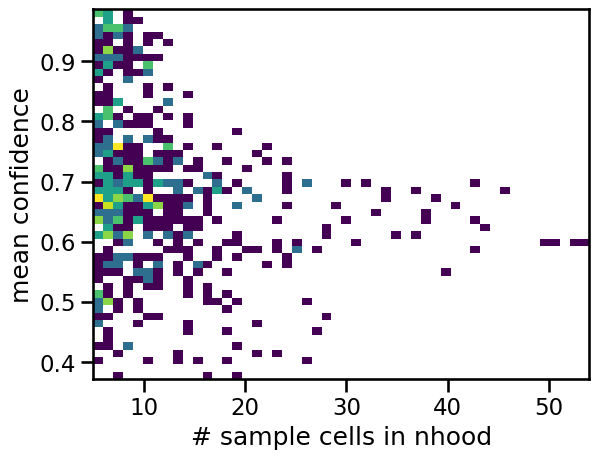

In [113]:
import matplotlib
plt.hist2d(x_counts[~np.isnan(x_conf)], x_conf[~np.isnan(x_conf)], norm=matplotlib.colors.LogNorm(), bins=50);
plt.xlabel("# sample cells in nhood");
plt.ylabel('mean confidence')

In [434]:
x_conf = get_nhood_adata(pac_design_adata)[:,10].layers['confidence'].toarray().flatten()
x_counts = get_nhood_adata(pac_design_adata)[:,10].X.toarray().flatten()
nhood_size = np.array(pac_design_adata.obsm['nhoods'].sum(0)).flatten()

In [98]:
import matplotlib
plt.hist2d(nhood_size,np.log(x_counts+1), norm=matplotlib.colors.LogNorm(), bins=50);
plt.ylabel("# sample cells in nhood");
plt.xlabel('tot cells in nhood')

NameError: name 'nhood_size' is not defined

Text(0, 0.5, 'mean confidence')

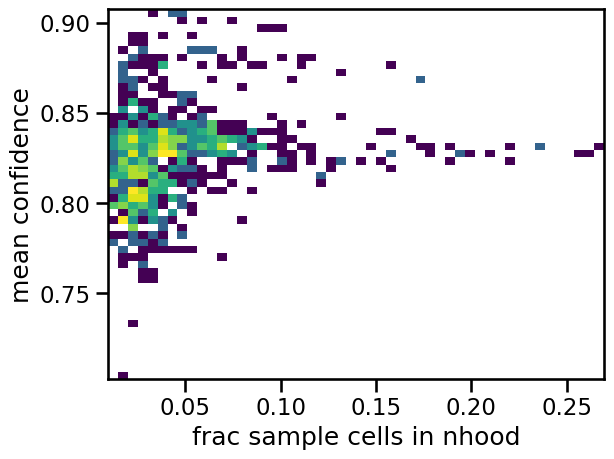

In [436]:
import matplotlib
plt.hist2d((x_counts/nhood_size)[~np.isnan(x_conf)], x_conf[~np.isnan(x_conf)], norm=matplotlib.colors.LogNorm(), bins=50);
plt.xlabel("frac sample cells in nhood");
plt.ylabel('mean confidence')

In [114]:
order_samples = get_nhood_adata(pac_design_adata)[obs].var['dataset_group'].sort_values()

In [115]:
colnames = (order_samples.index.astype('str') + "_" + order_samples.values.astype('str')).tolist()

<AxesSubplot:>

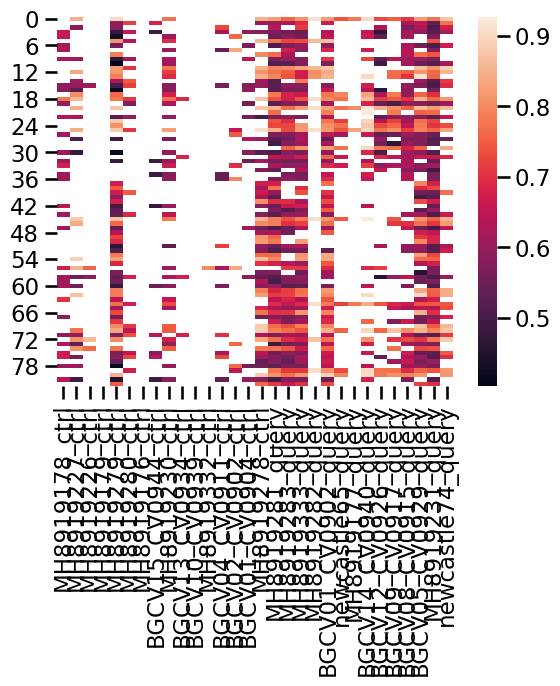

In [116]:
conf_df = pd.DataFrame(get_nhood_adata(pac_design_adata)[obs][:, order_samples.index].layers['confidence'], 
                       columns=colnames)

sns.heatmap(conf_df, xticklabels=True)

In [344]:
pa_nhood_obs = get_nhood_adata(pa_design_adata).obs.copy()
pac_nhood_obs = get_nhood_adata(pac_design_adata).obs.copy()
pc_nhood_obs = get_nhood_adata(pc_design_adata).obs.copy()

pac_nhood_obs['design'] = 'PAC'
pa_nhood_obs['design'] = 'PA'
pc_nhood_obs['design'] = 'PC'

nhood_obs_df = pd.concat([pac_nhood_obs, pc_nhood_obs, pa_nhood_obs])

In [345]:
%%R -i nhood_obs_df
dim(nhood_obs_df)

[1] 53461    20


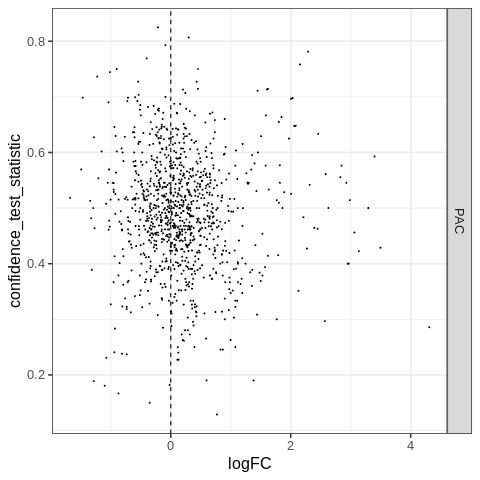

In [346]:
%%R
nhood_obs_df %>%
filter(design=='PAC') %>%
ggplot(aes(logFC, confidence_test_statistic)) +
geom_point(size=0.3) +
geom_point(data=. %>% filter(nhood_annotation=='Endothelium'), color='red') +
facet_grid(design~.) +
geom_vline(xintercept=0, linetype=2) +
theme_bw(base_size=16)

- Finding control cohort by agreement of composiiton: correlation across neighbourhoods/celltypes
- Distances between samples as a weight for testing
- Talk to Leah

- Test using the control in the PA design


In [554]:
pa_design_adata.obs['dataset_id'] = np.where(pa_design_adata.obs['dataset_id'].str.startswith("10_1016_j_cell_2021_02_018"), '10_1016_j_cell_2021_02_018', pa_design_adata.obs['dataset_id'])
milopy.utils.add_covariate_to_nhoods_var(pa_design_adata, ['sex', 'donor_id', 'dataset_id'])
nhood_adata = get_nhood_adata(pa_design_adata).T.copy()

In [555]:
nhood_adata.obs['total_counts'] = nhood_adata.X.toarray().sum(1)

In [556]:
sc.pp.normalize_per_cell(nhood_adata,counts_per_cell_after=10000);
sc.pp.log1p(nhood_adata)

In [572]:
sc.tl.pca(nhood_adata, n_comps=10)

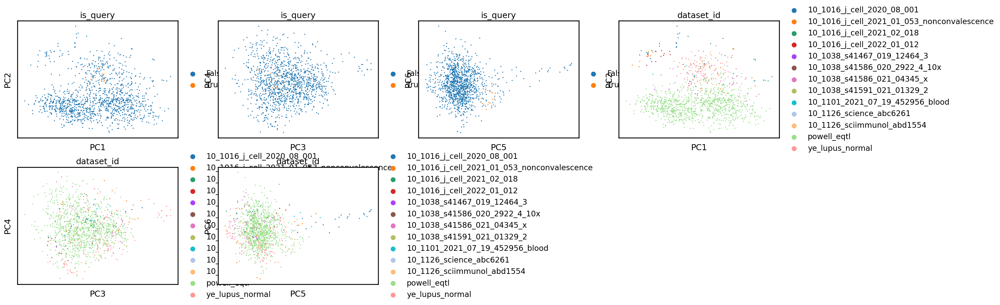

In [573]:
sc.pl.pca(nhood_adata, color=['is_query', 'dataset_id'], size=20, components=['1,2', '3,4', '5,6'])

In [574]:
df = pa_design_adata.obs[['dataset_id', 'sample_id']].drop_duplicates()
df.index = df.sample_id.values

In [575]:
def get_palette(adata, obs_col):
    palette = dict(zip(adata.obs[obs_col].cat.categories, adata.uns[obs_col + '_colors']))
    return(palette)

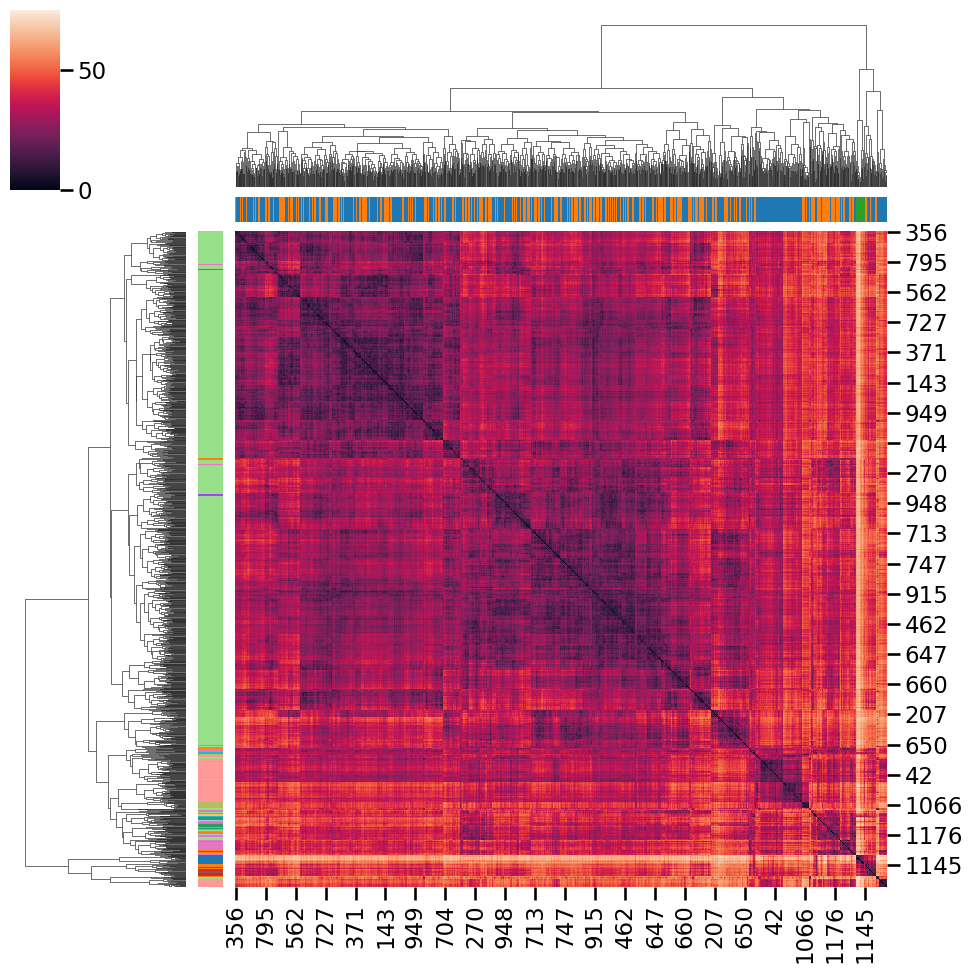

In [578]:
dist_mat = scipy.spatial.distance.cdist(nhood_adata.obsm['X_pca'], nhood_adata.obsm['X_pca'])
sns.clustermap(dist_mat, 
               row_colors=[get_palette(nhood_adata, 'dataset_id')[x] for x in nhood_adata.obs['dataset_id']], 
               col_colors=[get_palette(nhood_adata, 'sex')[x] for x in nhood_adata.obs['sex']]
              )

In [608]:
samples = nhood_adata.obs[nhood_adata.obs.dataset_id == "10_1038_s41591_021_01329_2"].index
dist_mat_self = scipy.spatial.distance.cdist(nhood_adata[samples].obsm['X_pca'], nhood_adata[samples].obsm['X_pca'])
dist_mat_other = scipy.spatial.distance.cdist(nhood_adata[samples].obsm['X_pca'], nhood_adata[~nhood_adata.obs_names.isin(samples)].obsm['X_pca'])
dist_mat.shape

(14, 1239)

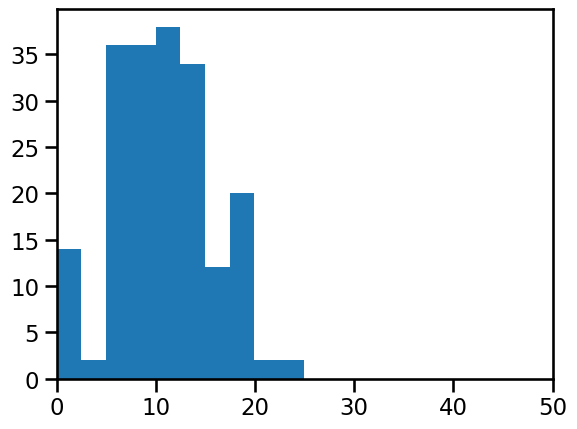

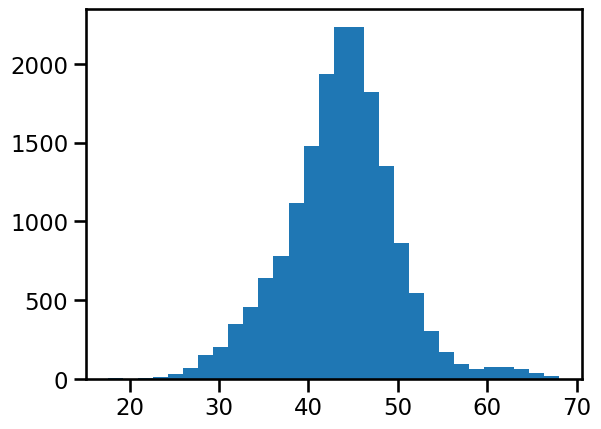

In [620]:
plt.hist(dist_mat_self.flatten(), bins=10);
plt.xlim(0,50);
plt.show();
plt.hist(dist_mat_other.flatten(), bins=30);

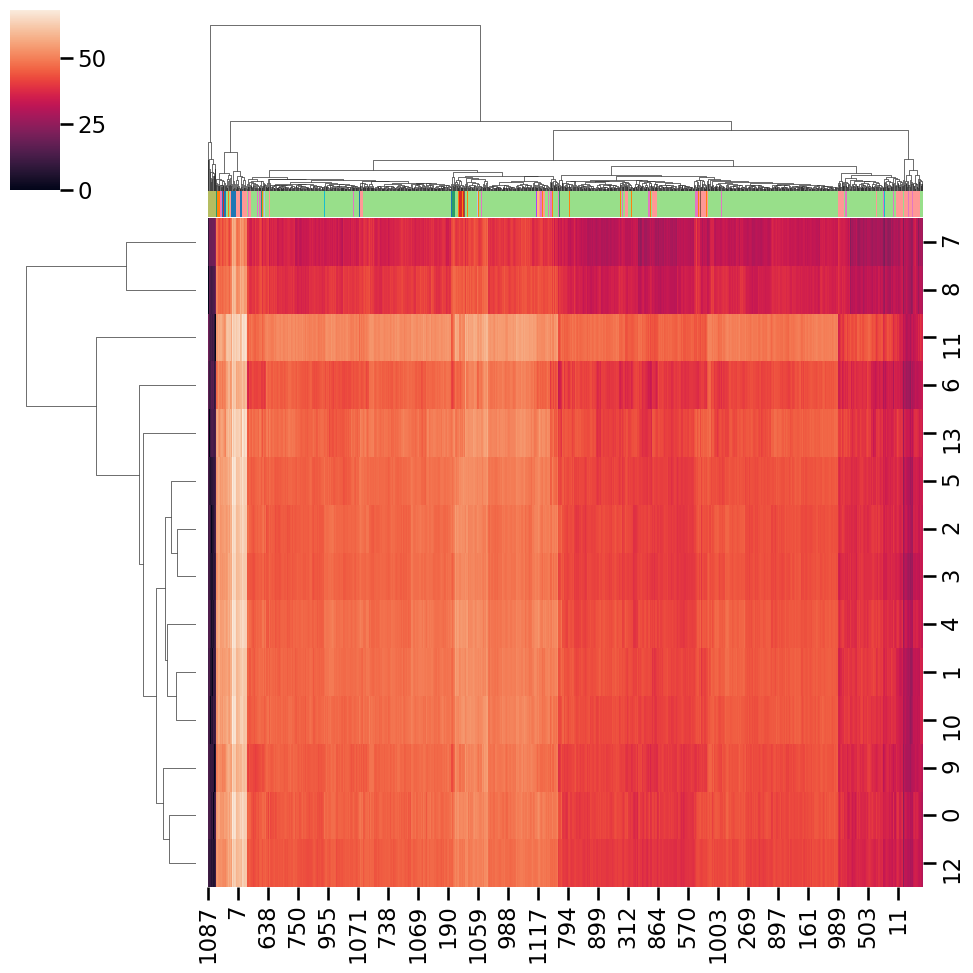

In [607]:
sns.clustermap(dist_mat, 
               col_colors=[get_palette(nhood_adata, 'dataset_id')[x] for x in nhood_adata.obs['dataset_id']]
              )

---

With CellTypist
---

### Train celltypist reference model

In [123]:
adata_atlas.layers['counts'] = adata_atlas.X.copy()

In [124]:
sc.pp.normalize_total(adata_atlas, target_sum=10000)
sc.pp.log1p(adata_atlas)

In [125]:
new_model = celltypist.train(adata_atlas, labels = 'cell_type', n_jobs = 10, feature_selection = True)

🍳 Preparing data before training
⚖️ Scaling input data
🏋️ Training data using SGD logistic regression
⚠️ Warning: it may take a long time to train this dataset with 589174 cells and 11724 genes, try to downsample cells and/or restrict genes to a subset (e.g., hvgs)


KeyboardInterrupt: 

In [ ]:
new_model.write(data_dir + 'PBMC_merged.normal.subsample500cells.celltypist_model.pkl')

### Predict cell type labels

In [19]:
adata_query.layers['counts'] = adata_query.X.copy()
adata_ctrl.layers['counts'] = adata_ctrl.X.copy()

In [26]:
adata_query.var_names = adata_query.var['SYMBOL'].values.astype('str')
adata_ctrl.var_names = adata_ctrl.var['SYMBOL'].values.astype('str')

In [20]:
sc.pp.normalize_total(adata_query, target_sum=10000)
sc.pp.log1p(adata_query)

In [27]:
predictions_query = celltypist.annotate(adata_query, 
                                  model = data_dir + 'PBMC_merged.normal.subsample500cells.celltypist_model.pkl',
                        majority_voting = False)

🔬 Input data has 56122 cells and 29453 genes
🔗 Matching reference genes in the model
🧬 3058 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


In [29]:
sc.pp.normalize_total(adata_ctrl, target_sum=10000)
sc.pp.log1p(adata_ctrl)

In [30]:
predictions_ctrl = celltypist.annotate(adata_ctrl, 
                                  model = data_dir + 'PBMC_merged.normal.subsample500cells.celltypist_model.pkl',
                        majority_voting = False)

🔬 Input data has 30703 cells and 29453 genes
🔗 Matching reference genes in the model
🧬 3058 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


In [1]:
import scanpy as sc
import milopy

sim_dir = '/lustre/scratch117/cellgen/team205/ed6/PBMC_CZI_integration_filtered/qPBMC_500cells_demo_perturb_cell_typenaive_B_cell_queryBatchdataset_id10_1038_s41591_021_01329_2_seed2022/'
# pac_design_adata = sc.read_h5ad(sim_dir + '/pac_design.h5ad')

In [8]:
def run_milo(pac_design_adata,
             query_group,
             reference_group,
             sample_col='sample_id',
             annotation_col='cell_type'
             ):
    milopy.core.make_nhoods(pac_design_adata, prop=0.1)
    milopy.core.count_nhoods(pac_design_adata, sample_col=sample_col)
    milopy.utils.annotate_nhoods(
        pac_design_adata[pac_design_adata.obs['dataset_group'] == reference_group], annotation_col)
    pac_design_adata.obs['is_query'] = pac_design_adata.obs['dataset_group'] == query_group
    milopy.core.DA_nhoods(pac_design_adata, design='~ is_query')
    # milopy.utils.build_nhood_graph(pac_design_adata)


In [15]:
smol_adata=pac_design_adata[0:10000]
run_milo(smol_adata, query_group='query', reference_group='ctrl')

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '
/home/jovyan/milopy/milopy/core.py:272: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  nhood_adata.obs = pd.concat([nhood_adata.obs, res], 1)


In [22]:
import milopy

In [18]:
smol_adata.uns['nhood_adata'].uns['annotation_labels'].tolist()

['B_cell',
 'CD4_positive_alpha_beta_T_cell',
 'CD8_positive_alpha_beta_T_cell',
 'CD14_low_CD16_positive_monocyte',
 'CD14_positive_monocyte',
 'CD16_negative_CD56_bright_natural_killer_cell_human',
 'CD16_positive_CD56_dim_natural_killer_cell_human',
 'CD34_positive_CD38_negative_hematopoietic_stem_cell',
 'ILC1_human',
 'IgA_plasma_cell',
 'IgG_plasma_cell',
 'IgM_plasma_cell',
 'T_follicular_helper_cell',
 'T_helper_1_cell',
 'T_helper_2_cell',
 'T_helper_22_cell',
 'central_memory_CD4_positive_alpha_beta_T_cell',
 'class_switched_memory_B_cell',
 'dendritic_cell',
 'dendritic_cell_human',
 'effector_CD8_positive_alpha_beta_T_cell',
 'effector_memory_CD4_positive_alpha_beta_T_cell',
 'effector_memory_CD8_positive_alpha_beta_T_cell',
 'erythrocyte',
 'erythroid_progenitor_cell_mammalian',
 'gamma_delta_T_cell',
 'group_2_innate_lymphoid_cell_human',
 'immature_B_cell',
 'mature_NK_T_cell',
 'monocyte',
 'mucosal_invariant_T_cell',
 'myeloid_dendritic_cell',
 'naive_thymus_derived_CD